# NAG-Time Results Visualization

This notebook visualizes and compares results from the NAG-time experiments across five model variants:
- **Original Baseline**: DMD without any negative guidance
- **Original + Neg**: DMD with negative guidance 
- **NAG Baseline**: NAG applied without negative guidance
- **NAG**: NAG with negative guidance starting from step 0
- **NAG Timed**: NAG with negative guidance starting from step 0.2

You can match images to their prompts and negative prompts, and compare outputs across models. The comparison allows you to verify that NAG baseline matches Original baseline (when no negative prompt), and measure the effect of negative guidance across approaches.

## 1. Import Required Libraries

In [1]:
import json
import pandas as pd
import numpy as np
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from collections import defaultdict
import ipywidgets as widgets
from IPython.display import Image as IPImage, display, HTML
import warnings
import torch
import cv2
from scipy import stats
from skimage.metrics import structural_similarity as ssim
warnings.filterwarnings('ignore')


In [5]:
# Initialize variables to avoid NameError if cells are run out of order
metrics_df_cached = None
metrics_df = None


## 2. Load Results and Prompt Data

In [5]:
# Define base paths
results_nag_base_dir = Path('/Users/andrewrevell/Projects/Uni/nag-time/results-nag-models')
results_original_base_dir = Path('/Users/andrewrevell/Projects/Uni/nag-time/results-original-models')
results_dd_base_dir = Path('/Users/andrewrevell/Projects/Uni/nag-time/results-dd-models')
prompts_path = Path('/Users/andrewrevell/Projects/Uni/nag-time/data/prompts_general.json')

# Model types to load
model_types = ['base', 'dmd', 'hyper', 'lcm', 'lightning', 'pcm', 'turbo']

# Load prompts
with open(prompts_path, 'r') as f:
    prompts_list = json.load(f)

# Create a dictionary to map prompt index to prompt/negative_prompt
prompts_dict = {i: p for i, p in enumerate(prompts_list)}

print(f"Loaded {len(prompts_list)} prompts")
print(f"NAG results directory: {results_nag_base_dir}")
print(f"Original results directory: {results_original_base_dir}")
print(f"Model types to load: {model_types}")
print(f"\nSample prompts:")
for i in range(min(3, len(prompts_list))):
    print(f"  {i}: {prompts_dict[i]['prompt']} | neg: {prompts_dict[i]['negative_prompt']}")


Loaded 16 prompts
NAG results directory: /Users/andrewrevell/Projects/Uni/nag-time/results-nag-models
Original results directory: /Users/andrewrevell/Projects/Uni/nag-time/results-original-models
Model types to load: ['base', 'dmd', 'hyper', 'lcm', 'lightning', 'pcm', 'turbo']

Sample prompts:
  0: A photo of a person | neg: male
  1: A photo of a person | neg: female
  2: A photo of a person | neg: old


In [6]:
# Organize results by model type and variant
model_types_nag = {
    'nag_baseline': 'baseline',
    'nag': 'with_negative_start0',
    'nag_timed': 'with_negative_start0p2'
}

model_types_original = {
    'original_baseline': 'baseline',
    'original_with_neg': 'with_negative'
}

model_types_dd = {
    'dd_baseline': 'dd_noneg',
    'dd_with_neg': 'dd_withneg'
}

seeds = ['42', '1337', '2025']

# Load all image paths organized by: model_type -> variant -> prompt -> seed
results_data = {}

for model_type in model_types:
    results_data[model_type] = defaultdict(lambda: {
        'nag_baseline': {}, 'nag': {}, 'nag_timed': {},
        'original_baseline': {}, 'original_with_neg': {},
        'dd_baseline': {}, 'dd_with_neg': {}
    })
    
    # Load NAG model results for this model type
    for model_name, folder_name in model_types_nag.items():
        model_path = results_nag_base_dir / model_type / folder_name
        if model_path.exists():
            for img_path in sorted(model_path.glob('*.png')):
                filename = img_path.stem
                # Parse filename: e.g., 0000_42_noneg.png or 0000_42_neg_s0.png
                parts = filename.split('_')
                if len(parts) >= 2:
                    try:
                        prompt_idx = int(parts[0])
                        seed = parts[1]
                        
                        if prompt_idx in prompts_dict:
                            results_data[model_type][prompt_idx][model_name][seed] = str(img_path)
                    except ValueError:
                        continue
    
    # Load Original model results for this model type
    for model_name, folder_name in model_types_original.items():
        model_path = results_original_base_dir / model_type / folder_name
        if model_path.exists():
            for img_path in sorted(model_path.glob('*.png')):
                filename = img_path.stem
                # Parse filename: e.g., 0000_42.png
                parts = filename.split('_')
                if len(parts) >= 2:
                    try:
                        prompt_idx = int(parts[0])
                        seed = parts[1]
                        
                        if prompt_idx in prompts_dict:
                            results_data[model_type][prompt_idx][model_name][seed] = str(img_path)
                    except ValueError:
                        continue
    
    # Load DD (Diversity Distillation) model results for this model type
    for model_name, folder_name in model_types_dd.items():
        model_path = results_dd_base_dir / model_type / folder_name
        if model_path.exists():
            for img_path in sorted(model_path.glob('*.png')):
                filename = img_path.stem
                # Parse filename: e.g., 0000_42.png (same format as original models)
                parts = filename.split('_')
                if len(parts) >= 2:
                    try:
                        prompt_idx = int(parts[0])
                        seed = parts[1]
                        
                        if prompt_idx in prompts_dict:
                            results_data[model_type][prompt_idx][model_name][seed] = str(img_path)
                    except ValueError:
                        continue

# Summary statistics
print(f"Organized results for {len(model_types)} model types")
print(f"\nResults by model type:")
for mt in model_types:
    count = len(results_data[mt])
    print(f"  {mt}: {count} prompts with data")

print(f"\nModel variants:")
print(f"  NAG models: {list(model_types_nag.keys())}")
print(f"  Original models: {list(model_types_original.keys())}")
print(f"  DD models: {list(model_types_dd.keys())}")
print(f"  Seeds: {seeds}")


Organized results for 7 model types

Results by model type:
  base: 16 prompts with data
  dmd: 16 prompts with data
  hyper: 16 prompts with data
  lcm: 16 prompts with data
  lightning: 16 prompts with data
  pcm: 16 prompts with data
  turbo: 16 prompts with data

Model variants:
  NAG models: ['nag_baseline', 'nag', 'nag_timed']
  Original models: ['original_baseline', 'original_with_neg']
  DD models: ['dd_baseline', 'dd_with_neg']
  Seeds: ['42', '1337', '2025']


## 5. Interactive Comparison Dashboard

In [7]:
# Define display functions for visualizations
def display_prompt_with_images(prompt_idx, seed='42', model_type='dmd'):
    """Display a single prompt with all model variants for a specific seed"""
    if model_type not in results_data or prompt_idx not in results_data[model_type]:
        print(f"No data for prompt {prompt_idx} in model type {model_type}")
        return
    
    prompt_info = prompts_dict[prompt_idx]
    images_dict = results_data[model_type][prompt_idx]
    
    # Create figure with 7 subplots (all model variants)
    fig, axes = plt.subplots(1, 7, figsize=(28, 4))
    fig.suptitle(f'Prompt {prompt_idx}: "{prompt_info["prompt"]}"\nNegative: "{prompt_info["negative_prompt"]}"', 
                 fontsize=14, fontweight='bold')
    
    model_names = ['original_baseline', 'original_with_neg', 'nag_baseline', 'nag', 'nag_timed', 'dd_baseline', 'dd_with_neg']
    model_labels = ['Original Baseline', 'Original + Neg', 'NAG Baseline', 'NAG (start=0)', 'NAG (start=0.2)', 'DD Baseline', 'DD + Neg']
    
    for ax, model_name, label in zip(axes, model_names, model_labels):
        if seed in images_dict[model_name]:
            img_path = images_dict[model_name][seed]
            img = Image.open(img_path)
            ax.imshow(img)
            ax.set_title(label, fontweight='bold')
        else:
            ax.text(0.5, 0.5, f'No image for {label}', 
                   ha='center', va='center', transform=ax.transAxes)
            ax.set_title(label)
        ax.axis('off')
    
    plt.tight_layout()
    plt.show()

def display_all_seeds_comparison(prompt_idx, model_type='dmd'):
    """Display all seeds for a single prompt across all model variants"""
    if model_type not in results_data or prompt_idx not in results_data[model_type]:
        print(f"No data for prompt {prompt_idx} in model type {model_type}")
        return
    
    prompt_info = prompts_dict[prompt_idx]
    images_dict = results_data[model_type][prompt_idx]
    
    # Create figure with 7x3 grid (7 models x 3 seeds)
    fig, axes = plt.subplots(7, 3, figsize=(15, 28))
    fig.suptitle(f'Prompt {prompt_idx}: "{prompt_info["prompt"]}"\nNegative: "{prompt_info["negative_prompt"]}"', 
                 fontsize=14, fontweight='bold')
    
    model_names = ['original_baseline', 'original_with_neg', 'nag_baseline', 'nag', 'nag_timed', 'dd_baseline', 'dd_with_neg']
    model_labels = ['Original Baseline', 'Original + Neg', 'NAG Baseline', 'NAG (start=0)', 'NAG (start=0.2)', 'DD Baseline', 'DD + Neg']
    
    for row, (model_name, label) in enumerate(zip(model_names, model_labels)):
        for col, seed in enumerate(seeds):
            ax = axes[row, col]
            
            if seed in images_dict[model_name]:
                img_path = images_dict[model_name][seed]
                img = Image.open(img_path)
                ax.imshow(img)
                ax.set_title(f'{label} (seed={seed})', fontsize=10)
            else:
                ax.text(0.5, 0.5, f'No image', ha='center', va='center', transform=ax.transAxes)
                ax.set_title(f'{label}')
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

def display_grid_comparison(prompt_indices, seed='42', model_type='dmd'):
    """Display multiple prompts in a grid for comparison at a specific seed"""
    n_prompts = len(prompt_indices)
    fig, axes = plt.subplots(n_prompts, 5, figsize=(20, 4*n_prompts))
    
    if n_prompts == 1:
        axes = axes.reshape(1, -1)
    
    model_names = ['original_baseline', 'original_with_neg', 'nag_baseline', 'nag', 'nag_timed', 'dd_baseline', 'dd_with_neg']
    model_labels = ['Original Baseline', 'Original + Neg', 'NAG Baseline', 'NAG (start=0)', 'NAG (start=0.2)', 'DD Baseline', 'DD + Neg']
    
    for row, prompt_idx in enumerate(prompt_indices):
        if model_type not in results_data or prompt_idx not in results_data[model_type]:
            continue
        
        images_dict = results_data[model_type][prompt_idx]
        prompt_info = prompts_dict[prompt_idx]
        
        for col, (model_name, label) in enumerate(zip(model_names, model_labels)):
            ax = axes[row, col]
            
            if seed in images_dict[model_name]:
                img_path = images_dict[model_name][seed]
                img = Image.open(img_path)
                ax.imshow(img)
                if row == 0:
                    ax.set_title(label, fontweight='bold')
            else:
                ax.text(0.5, 0.5, f'No image', ha='center', va='center', transform=ax.transAxes)
            
            # Add prompt text on left side
            if col == 0:
                ax.set_ylabel(f'Prompt {prompt_idx}\n"{prompt_info["prompt"]}"', fontsize=9)
            
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

print("✓ Display functions defined")


✓ Display functions defined


In [8]:
# Create interactive widgets for exploration
model_type_dropdown = widgets.Dropdown(
    options=model_types,
    value='dmd',
    description='Model Type:',
)

prompt_dropdown = widgets.Dropdown(
    options=[(f"Prompt {i}: {prompts_dict[i]['prompt']} | neg: {prompts_dict[i]['negative_prompt']}", i) 
             for i in sorted(results_data['dmd'].keys())],
    description='Select Prompt:',
    layout=widgets.Layout(width='600px')
)

seed_dropdown = widgets.Dropdown(
    options=[(seed, seed) for seed in seeds],
    description='Select Seed:',
)

view_mode = widgets.ToggleButtons(
    options=['Single Seed', 'All Seeds'],
    description='View Mode:'
)

def update_display(prompt_idx, seed, mode, model_type):
    if mode == 'Single Seed':
        display_prompt_with_images(prompt_idx, seed, model_type)
    else:
        display_all_seeds_comparison(prompt_idx, model_type)

output = widgets.Output()

def on_model_change(change):
    """Update prompts list when model type changes"""
    with output:
        new_model_type = model_type_dropdown.value
        available_prompts = sorted(results_data[new_model_type].keys())
        new_options = [(f"Prompt {i}: {prompts_dict[i]['prompt']} | neg: {prompts_dict[i]['negative_prompt']}", i) 
                       for i in available_prompts]
        prompt_dropdown.options = new_options

def on_change(change):
    with output:
        output.clear_output(wait=True)
        update_display(prompt_dropdown.value, seed_dropdown.value, view_mode.value, model_type_dropdown.value)

model_type_dropdown.observe(on_model_change, names='value')
model_type_dropdown.observe(on_change, names='value')
prompt_dropdown.observe(on_change, names='value')
seed_dropdown.observe(on_change, names='value')
view_mode.observe(on_change, names='value')

print("=" * 80)
print("INTERACTIVE COMPARISON DASHBOARD")
print("=" * 80)
print("\nUse the controls below to explore and compare results:")
print("  - Select a model type (base, dmd, hyper, lcm, lightning, pcm, turbo)")
print("  - Select a prompt to analyze")
print("  - Choose between 'Single Seed' or 'All Seeds' view")
print("  - Original models (baseline and with negative)")
print("  - NAG models (baseline, with_negative_start0, with_negative_start0p2)")
print("  - DD models (baseline and with negative)")
print()

dashboard = widgets.VBox([
    widgets.HBox([model_type_dropdown]),
    widgets.HBox([prompt_dropdown]),
    widgets.HBox([seed_dropdown, view_mode]),
    output
])

display(dashboard)

# Show initial comparison
on_change(None)


INTERACTIVE COMPARISON DASHBOARD

Use the controls below to explore and compare results:
  - Select a model type (base, dmd, hyper, lcm, lightning, pcm, turbo)
  - Select a prompt to analyze
  - Choose between 'Single Seed' or 'All Seeds' view
  - Original models (baseline and with negative)
  - NAG models (baseline, with_negative_start0, with_negative_start0p2)
  - DD models (baseline and with negative)



## 6. Grid-Based Comparison of Multiple Prompts

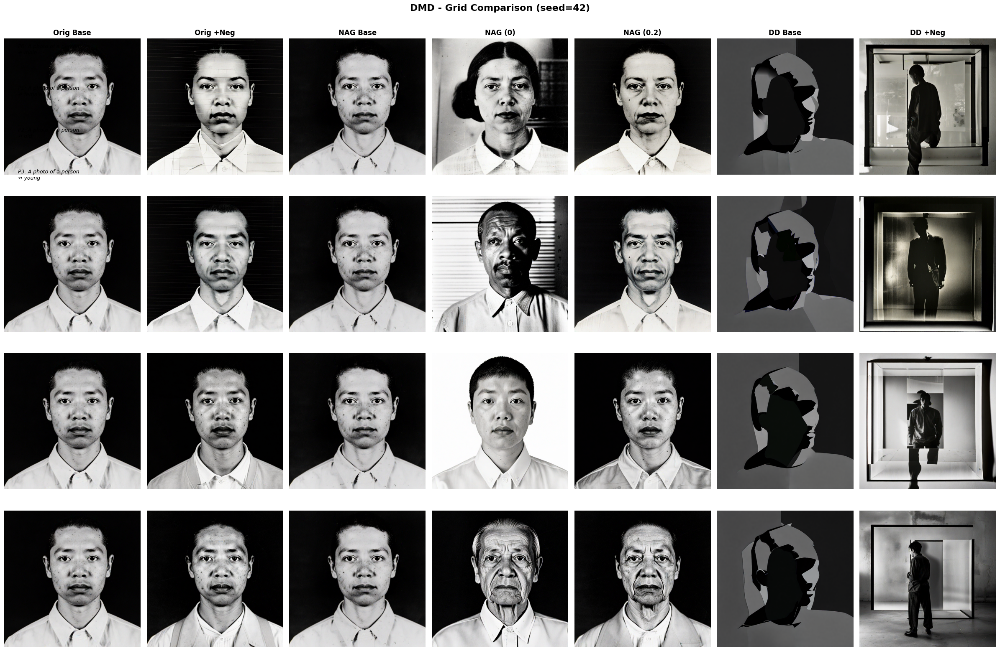

In [10]:
def display_grid_comparison(prompts_range, seed='42', model_type='dmd'):
    """Display a grid comparison of multiple prompts for a specific model type"""
    num_prompts = len(prompts_range)
    num_models = 7  # original_baseline, original_with_neg, nag_baseline, nag, nag_timed, dd_baseline, dd_with_neg
    fig, axes = plt.subplots(num_prompts, num_models, figsize=(24, 4*num_prompts))
    
    if num_prompts == 1:
        axes = axes.reshape(1, -1)
    
    model_names = ['original_baseline', 'original_with_neg', 'nag_baseline', 'nag', 'nag_timed', 'dd_baseline', 'dd_with_neg']
    model_labels = ['Orig Base', 'Orig +Neg', 'NAG Base', 'NAG (0)', 'NAG (0.2)', 'DD Base', 'DD +Neg']
    
    fig.suptitle(f'{model_type.upper()} - Grid Comparison (seed={seed})', fontsize=16, fontweight='bold', y=0.995)
    
    for row, prompt_idx in enumerate(prompts_range):
        if prompt_idx not in results_data[model_type]:
            continue
        
        prompt_info = prompts_dict[prompt_idx]
        images_dict = results_data[model_type][prompt_idx]
        
        # Add title for this row
        fig.text(0.02, 0.92 - (row * (4*num_prompts)**(-1)), 
                f'P{prompt_idx}: {prompt_info["prompt"]}\n↛ {prompt_info["negative_prompt"]}',
                fontsize=9, style='italic')
        
        for col, (model_name, label) in enumerate(zip(model_names, model_labels)):
            ax = axes[row, col] if num_prompts > 1 else axes[col]
            
            if seed in images_dict[model_name]:
                img_path = images_dict[model_name][seed]
                img = Image.open(img_path)
                ax.imshow(img)
                if row == 0:
                    ax.set_title(label, fontweight='bold')
            else:
                ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes)
            ax.axis('off')
    
    plt.tight_layout()
    plt.show()

# Display grid for first 4 prompts in dmd model
available_prompts = sorted(results_data['dmd'].keys())[:4]
display_grid_comparison(available_prompts, seed='42', model_type='dmd')


## 7. Summary and Statistics

In [11]:
print("=" * 80)
print("RESULTS SUMMARY")
print("=" * 80)

# Count available images per model and model type
for model_type in model_types:
    print(f"\n{model_type.upper()}:")
    print("-" * 80)
    
    model_counts = {
        'original_baseline': 0, 'original_with_neg': 0,
        'nag_baseline': 0, 'nag': 0, 'nag_timed': 0
    }
    seed_counts = {seed: 0 for seed in seeds}
    
    for prompt_idx in results_data[model_type]:
        for model_name in model_counts:
            for seed in results_data[model_type][prompt_idx][model_name]:
                model_counts[model_name] += 1
                seed_counts[seed] += 1
    
    print(f"  Total prompts with results: {len(results_data[model_type])}")
    print(f"  Available seeds: {seeds}")
    print(f"\n  Images per model variant:")
    for model_name, count in sorted(model_counts.items()):
        print(f"    {model_name}: {count} images")
    
    print(f"\n  Images per seed:")
    for seed, count in seed_counts.items():
        print(f"    seed={seed}: {count} images")

print("\n" + "=" * 80)
print("USAGE GUIDE")
print("=" * 80)
print("""
1. Use the Interactive Dashboard to explore results across all model types
2. Change between 'Single Seed' and 'All Seeds' view modes
3. Use the grid comparison function to view multiple prompts at once
4. Run the display functions directly with specific parameters:
   - display_prompt_with_images(prompt_idx, seed='42', model_type='dmd')
   - display_all_seeds_comparison(prompt_idx, model_type='dmd')
   - display_grid_comparison([0, 1, 2, 3], seed='42', model_type='dmd')

Available Models:
  - base: Base model variant
  - dmd: DMD model variant
  - hyper: Hyper model variant
  - lcm: LCM model variant
  - lightning: Lightning model variant
  - pcm: PCM model variant
  - turbo: Turbo model variant

Model Variants:
  - Original Baseline: Without any negative guidance
  - Original + Neg: With negative guidance
  - NAG Baseline: NAG applied (should match Original without negatives when no negative prompt)
  - NAG (start=0): NAG with negative guidance from step 0
  - NAG (start=0.2): NAG with negative guidance from step 0.2
""")


RESULTS SUMMARY

BASE:
--------------------------------------------------------------------------------
  Total prompts with results: 16
  Available seeds: ['42', '1337', '2025']

  Images per model variant:
    nag: 48 images
    nag_baseline: 48 images
    nag_timed: 48 images
    original_baseline: 48 images
    original_with_neg: 48 images

  Images per seed:
    seed=42: 80 images
    seed=1337: 80 images
    seed=2025: 80 images

DMD:
--------------------------------------------------------------------------------
  Total prompts with results: 16
  Available seeds: ['42', '1337', '2025']

  Images per model variant:
    nag: 48 images
    nag_baseline: 48 images
    nag_timed: 48 images
    original_baseline: 48 images
    original_with_neg: 48 images

  Images per seed:
    seed=42: 80 images
    seed=1337: 80 images
    seed=2025: 80 images

HYPER:
--------------------------------------------------------------------------------
  Total prompts with results: 16
  Available seeds

## 8. Metrics: Negative Elimination & Image Preservation

In [12]:
# Load CLIP model for similarity computations
print("Loading CLIP model for metrics computation...")
try:
    import clip
    device = "cuda" if torch.cuda.is_available() else "cpu"
    print(f"  Using device: {device}")
    model, preprocess = clip.load("ViT-B/32", device=device)
    tokenizer = clip.tokenize
    print(f"✓ CLIP model loaded successfully (ViT-B/32)")
except ImportError as e:
    print(f"Installing CLIP from GitHub...")
    import subprocess
    subprocess.check_call(['pip', 'install', 'git+https://github.com/openai/CLIP.git', '-q'])
    import clip
    device = "cuda" if torch.cuda.is_available() else "cpu"
    model, preprocess = clip.load("ViT-B/32", device=device)
    tokenizer = clip.tokenize
    print(f"✓ CLIP model loaded successfully after install (ViT-B/32)")
except Exception as e:
    print(f"ERROR: Failed to load CLIP: {e}")
    print("Please install manually: pip install git+https://github.com/openai/CLIP.git")
    raise


Loading CLIP model for metrics computation...
  Using device: cpu
✓ CLIP model loaded successfully (ViT-B/32)


In [13]:
def compute_clip_similarity(image_path, text, model, preprocess, tokenizer, device):
    """
    Compute CLIP similarity between an image and text.
    Returns a score between 0 and 1.
    """
    try:
        # Load and preprocess image
        img = Image.open(image_path).convert('RGB')
        image_tensor = preprocess(img).unsqueeze(0).to(device)
        
        # Tokenize text
        text_tokens = tokenizer(text).to(device)
        
        # Get embeddings
        with torch.no_grad():
            image_features = model.encode_image(image_tensor)
            text_features = model.encode_text(text_tokens)
            
            # Normalize embeddings
            image_features /= image_features.norm(dim=-1, keepdim=True)
            text_features /= text_features.norm(dim=-1, keepdim=True)
            
            # Compute similarity (cosine similarity)
            similarity = (image_features @ text_features.T).item()
            
        return max(0, similarity)  # Clamp to [0, 1]
    except Exception as e:
        print(f"Error computing CLIP similarity: {e}")
        return 0.0

def compute_negative_elimination_score(image_path, positive_prompt, negative_prompt, model, preprocess, tokenizer, device):
    """
    Compute negative elimination score.
    Score = 1 - (similarity_to_negative / similarity_to_positive)
    
    - Score near 1.0: Good negative elimination
    - Score near 0.0: Poor negative elimination
    - Negative scores clamped to 0.0
    """

    print()

    sim_positive = compute_clip_similarity(image_path, positive_prompt, model, preprocess, tokenizer, device)
    sim_negative = compute_clip_similarity(image_path, negative_prompt, model, preprocess, tokenizer, device)
    

    # Avoid division by zero
    if sim_positive < 0.001:
        return 0.0
    
    score = 1.0 - (sim_negative / sim_positive)
    return max(0.0, score)  # Clamp negative values to 0

def compute_ssim_score(baseline_img_path, variant_img_path):
    """
    Compute multi-scale SSIM between baseline and variant image.
    Returns average SSIM across scales.
    
    - Score near 1.0: Images are very similar
    - Score near 0.0: Images are very different
    """
    try:
        # Load images as RGB
        img1 = cv2.imread(str(baseline_img_path))
        img2 = cv2.imread(str(variant_img_path))
        
        if img1 is None or img2 is None:
            return 0.0
        
        # Convert to grayscale for SSIM calculation
        gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
        gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
        
        # Compute SSIM
        score, _ = ssim(gray1, gray2, full=True)
        return float(score)
    except Exception as e:
        print(f"Error computing SSIM: {e}")
        return 0.0

print("✓ Metric functions defined successfully")


✓ Metric functions defined successfully


# PHASE 1 & 2: Raw CLIP and SSIM Computation (Cached)

Before proceeding with derived metrics (conditional CLIP, negative elimination scores, etc.), we first compute and cache the raw CLIP and SSIM values. This allows rapid iteration on new metrics without recomputing expensive image comparisons.

In [ ]:
# PHASE 1: Compute and Cache Raw CLIP Scores

print("=" * 120)
print("PHASE 1: RAW CLIP SCORE COMPUTATION & CACHING")
print("=" * 120)

# Cache file path
clip_raw_cache = Path('/Users/andrewrevell/Projects/Uni/nag-time/clip_raw_scores.csv')

# Check if cache exists
if clip_raw_cache.exists():
    print(f"\n✓ Loading cached CLIP scores from {clip_raw_cache.name}")
    clip_raw_df = pd.read_csv(clip_raw_cache)
    print(f"  Loaded {len(clip_raw_df)} CLIP score pairs")
else:
    print(f"\n✓ Cache not found. Computing raw CLIP scores...")
    print("  This computes: sim(image, positive) and sim(image, negative) for ALL image pairs")
    print()
    
    clip_raw_results = []
    
    # ============ ORIGINAL MODELS ============
    print("Computing for ORIGINAL MODELS:")
    for model_type in model_types:
        print(f"  {model_type.upper()}...", end="")
        
        for prompt_idx in sorted(results_data[model_type].keys()):
            if prompt_idx not in prompts_dict:
                continue
            
            prompt_info = prompts_dict[prompt_idx]
            positive = prompt_info['prompt']
            negative = prompt_info['negative_prompt']
            images_dict = results_data[model_type][prompt_idx]
            
            for seed in seeds:
                # Baseline (original baseline - no negative prompt)
                if seed in images_dict['original_baseline']:
                    baseline_path = images_dict['original_baseline'][seed]
                    clip_pos_baseline = compute_clip_similarity(baseline_path, positive, model, preprocess, tokenizer, device)
                    clip_neg_baseline = compute_clip_similarity(baseline_path, negative, model, preprocess, tokenizer, device)
                    
                    clip_raw_results.append({
                        'model_type': model_type,
                        'variant': 'original_baseline',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'positive_prompt': positive,
                        'negative_prompt': negative,
                        'clip_positive': clip_pos_baseline,
                        'clip_negative': clip_neg_baseline,
                    })
                
                # With Negative (original model with negative prompt)
                if seed in images_dict['original_with_neg']:
                    with_neg_path = images_dict['original_with_neg'][seed]
                    clip_pos_with_neg = compute_clip_similarity(with_neg_path, positive, model, preprocess, tokenizer, device)
                    clip_neg_with_neg = compute_clip_similarity(with_neg_path, negative, model, preprocess, tokenizer, device)
                    
                    clip_raw_results.append({
                        'model_type': model_type,
                        'variant': 'original_with_neg',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'positive_prompt': positive,
                        'negative_prompt': negative,
                        'clip_positive': clip_pos_with_neg,
                        'clip_negative': clip_neg_with_neg,
                    })
        
        print(" ✓")
    
    # ============ NAG MODELS ============
    print("\n  Computing for NAG MODELS:")
    for model_type in model_types:
        print(f"  {model_type.upper()}...", end="")
        
        for prompt_idx in sorted(results_data[model_type].keys()):
            if prompt_idx not in prompts_dict:
                continue
            
            prompt_info = prompts_dict[prompt_idx]
            positive = prompt_info['prompt']
            negative = prompt_info['negative_prompt']
            images_dict = results_data[model_type][prompt_idx]
            
            for seed in seeds:
                # NAG Baseline (NAG without negative guidance)
                if seed in images_dict['nag_baseline']:
                    nag_baseline_path = images_dict['nag_baseline'][seed]
                    sim_pos_nag_baseline = compute_clip_similarity(nag_baseline_path, positive, model, preprocess, tokenizer, device)
                    sim_neg_nag_baseline = compute_clip_similarity(nag_baseline_path, negative, model, preprocess, tokenizer, device)
                    
                    clip_raw_results.append({
                        'model_type': model_type,
                        'variant': 'nag_baseline',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'positive_prompt': positive,
                        'negative_prompt': negative,
                        'sim_positive': sim_pos_nag_baseline,
                        'sim_negative': sim_neg_nag_baseline,
                    })
                
                # NAG (start=0)
                if seed in images_dict['nag']:
                    nag_path = images_dict['nag'][seed]
                    sim_pos_nag = compute_clip_similarity(nag_path, positive, model, preprocess, tokenizer, device)
                    sim_neg_nag = compute_clip_similarity(nag_path, negative, model, preprocess, tokenizer, device)
                    
                    clip_raw_results.append({
                        'model_type': model_type,
                        'variant': 'nag',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'positive_prompt': positive,
                        'negative_prompt': negative,
                        'sim_positive': sim_pos_nag,
                        'sim_negative': sim_neg_nag,
                    })
                
                # NAG Timed (start=0.2)
                if seed in images_dict['nag_timed']:
                    nag_timed_path = images_dict['nag_timed'][seed]
                    sim_pos_nag_timed = compute_clip_similarity(nag_timed_path, positive, model, preprocess, tokenizer, device)
                    sim_neg_nag_timed = compute_clip_similarity(nag_timed_path, negative, model, preprocess, tokenizer, device)
                    
                    clip_raw_results.append({
                        'model_type': model_type,
                        'variant': 'nag_timed',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'positive_prompt': positive,
                        'negative_prompt': negative,
                        'sim_positive': sim_pos_nag_timed,
                        'sim_negative': sim_neg_nag_timed,
                    })
        
        print(" ✓")
    
    # ============ DD MODELS (Diversity Distillation) ============
    print("\n  Computing for DD MODELS (Diversity Distillation):")
    for model_type in model_types:
        print(f"  {model_type.upper()}...", end="")
        
        for prompt_idx in sorted(results_data[model_type].keys()):
            if prompt_idx not in prompts_dict:
                continue
            
            prompt_info = prompts_dict[prompt_idx]
            positive = prompt_info['prompt']
            negative = prompt_info['negative_prompt']
            images_dict = results_data[model_type][prompt_idx]
            
            for seed in seeds:
                # DD Baseline (DD without negative prompt)
                if seed in images_dict['dd_baseline']:
                    dd_baseline_path = images_dict['dd_baseline'][seed]
                    sim_pos_dd_baseline = compute_clip_similarity(dd_baseline_path, positive, model, preprocess, tokenizer, device)
                    sim_neg_dd_baseline = compute_clip_similarity(dd_baseline_path, negative, model, preprocess, tokenizer, device)
                    
                    clip_raw_results.append({
                        'model_type': model_type,
                        'variant': 'dd_baseline',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'positive_prompt': positive,
                        'negative_prompt': negative,
                        'sim_positive': sim_pos_dd_baseline,
                        'sim_negative': sim_neg_dd_baseline,
                    })
                
                # DD with Neg (DD with negative guidance)
                if seed in images_dict['dd_with_neg']:
                    dd_with_neg_path = images_dict['dd_with_neg'][seed]
                    sim_pos_dd_with_neg = compute_clip_similarity(dd_with_neg_path, positive, model, preprocess, tokenizer, device)
                    sim_neg_dd_with_neg = compute_clip_similarity(dd_with_neg_path, negative, model, preprocess, tokenizer, device)
                    
                    clip_raw_results.append({
                        'model_type': model_type,
                        'variant': 'dd_with_neg',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'positive_prompt': positive,
                        'negative_prompt': negative,
                        'sim_positive': sim_pos_dd_with_neg,
                        'sim_negative': sim_neg_dd_with_neg,
                    })
        
        print(" ✓")
    
    print(f"\n✓ CLIP computation complete!")
    print(f"  Total CLIP score pairs: {len(clip_raw_results)}")
    
    # Convert to DataFrame and save
    clip_raw_df = pd.DataFrame(clip_raw_results)
    clip_raw_df.to_csv(clip_raw_cache, index=False)
    print(f"  ✓ Saved to {clip_raw_cache.name}")

print(f"\n{len(clip_raw_df)} raw CLIP scores available for derived metrics")
print(f"Columns: {list(clip_raw_df.columns)}")
print(f"Example rows:")
print(clip_raw_df[['model_type', 'variant', 'prompt_idx', 'sim_positive', 'sim_negative']].head(10))

PHASE 1: RAW CLIP SCORE COMPUTATION & CACHING

✓ Loading cached CLIP scores from clip_raw_scores.csv
  Loaded 2256 CLIP score pairs

2256 raw CLIP scores available for derived metrics
Columns: ['model_type', 'variant', 'prompt_idx', 'seed', 'positive_prompt', 'negative_prompt', 'sim_positive', 'sim_negative']
Example rows:
  model_type            variant  prompt_idx  sim_positive  sim_negative
0       base  original_baseline           0      0.258106      0.206169
1       base  original_with_neg           0      0.259856      0.189632
2       base  original_baseline           0      0.266891      0.211548
3       base  original_with_neg           0      0.270773      0.207478
4       base  original_baseline           0      0.273641      0.190270
5       base  original_with_neg           0      0.260879      0.180046
6       base  original_baseline           1      0.258106      0.195294
7       base  original_with_neg           1      0.241252      0.134099
8       base  original_base

✓ Metric functions defined successfully


In [280]:
# PHASE 2: Compute and Cache Raw SSIM Scores

print("\n" + "=" * 120)
print("PHASE 2: RAW SSIM SCORE COMPUTATION & CACHING")
print("=" * 120)

# Cache file path
ssim_raw_cache = Path('/Users/andrewrevell/Projects/Uni/nag-time/ssim_raw_scores.csv')

# Check if cache exists
if ssim_raw_cache.exists():
    print(f"\n✓ Loading cached SSIM scores from {ssim_raw_cache.name}")
    ssim_raw_df = pd.read_csv(ssim_raw_cache)
    print(f"  Loaded {len(ssim_raw_df)} SSIM score pairs")
else:
    print(f"\n✓ Cache not found. Computing raw SSIM scores...")
    print("  This computes: SSIM between baseline and variant images")
    print()
    
    ssim_raw_results = []
    
    # ============ ORIGINAL MODELS: with_negative vs baseline ============
    print("Computing for ORIGINAL MODELS (with_negative vs baseline):")
    for model_type in model_types:
        print(f"  {model_type.upper()}...", end="")
        
        for prompt_idx in sorted(results_data[model_type].keys()):
            images_dict = results_data[model_type][prompt_idx]
            
            for seed in seeds:
                # Compare: with_negative vs baseline
                if seed in images_dict['original_baseline'] and seed in images_dict['original_with_neg']:
                    baseline_path = images_dict['original_baseline'][seed]
                    with_neg_path = images_dict['original_with_neg'][seed]
                    
                    ssim_score = compute_ssim_score(baseline_path, with_neg_path)
                    
                    ssim_raw_results.append({
                        'model_type': model_type,
                        'comparison': 'original_with_neg_vs_baseline',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'image1_path': baseline_path,
                        'image2_path': with_neg_path,
                        'ssim_score': ssim_score,
                    })
        
        print(" ✓")
    
    # ============ NAG MODELS: with_negative vs baseline ============
    print("\n  Computing for NAG MODELS (with_negative_start0 vs baseline):")
    for model_type in model_types:
        print(f"  {model_type.upper()}...", end="")
        
        for prompt_idx in sorted(results_data[model_type].keys()):
            images_dict = results_data[model_type][prompt_idx]
            
            for seed in seeds:
                # Compare: nag (start=0) vs nag_baseline
                if seed in images_dict['nag_baseline'] and seed in images_dict['nag']:
                    baseline_path = images_dict['nag_baseline'][seed]
                    nag_path = images_dict['nag'][seed]
                    
                    ssim_score = compute_ssim_score(baseline_path, nag_path)
                    
                    ssim_raw_results.append({
                        'model_type': model_type,
                        'comparison': 'nag_with_neg_vs_baseline',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'image1_path': baseline_path,
                        'image2_path': nag_path,
                        'ssim_score': ssim_score,
                    })
        
        print(" ✓")
    
    # ============ NAG MODELS: with_negative_start0p2 vs baseline ============
    print("\n  Computing for NAG MODELS (with_negative_start0p2 vs baseline):")
    for model_type in model_types:
        print(f"  {model_type.upper()}...", end="")
        
        for prompt_idx in sorted(results_data[model_type].keys()):
            images_dict = results_data[model_type][prompt_idx]
            
            for seed in seeds:
                # Compare: nag_timed (start=0.2) vs nag_baseline
                if seed in images_dict['nag_baseline'] and seed in images_dict['nag_timed']:
                    baseline_path = images_dict['nag_baseline'][seed]
                    nag_timed_path = images_dict['nag_timed'][seed]
                    
                    ssim_score = compute_ssim_score(baseline_path, nag_timed_path)
                    
                    ssim_raw_results.append({
                        'model_type': model_type,
                        'comparison': 'nag_timed_with_neg_vs_baseline',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'image1_path': baseline_path,
                        'image2_path': nag_timed_path,
                        'ssim_score': ssim_score,
                    })
        
        print(" ✓")
    
    # ============ DD MODELS: with_neg vs baseline ============
    print("\n  Computing for DD MODELS (with_neg vs baseline):")
    for model_type in model_types:
        print(f"  {model_type.upper()}...", end="")
        
        for prompt_idx in sorted(results_data[model_type].keys()):
            images_dict = results_data[model_type][prompt_idx]
            
            for seed in seeds:
                # Compare: dd_with_neg vs dd_baseline
                if seed in images_dict['dd_baseline'] and seed in images_dict['dd_with_neg']:
                    baseline_path = images_dict['dd_baseline'][seed]
                    with_neg_path = images_dict['dd_with_neg'][seed]
                    
                    ssim_score = compute_ssim_score(baseline_path, with_neg_path)
                    
                    ssim_raw_results.append({
                        'model_type': model_type,
                        'comparison': 'dd_with_neg_vs_baseline',
                        'prompt_idx': prompt_idx,
                        'seed': seed,
                        'image1_path': baseline_path,
                        'image2_path': with_neg_path,
                        'ssim_score': ssim_score,
                    })
        
        print(" ✓")
    
    print(f"\n✓ SSIM computation complete!")
    print(f"  Total SSIM score pairs: {len(ssim_raw_results)}")
    
    # Convert to DataFrame and save
    ssim_raw_df = pd.DataFrame(ssim_raw_results)
    ssim_raw_df.to_csv(ssim_raw_cache, index=False)
    print(f"  ✓ Saved to {ssim_raw_cache.name}")

print(f"\n{len(ssim_raw_df)} raw SSIM scores available for derived metrics")
print(f"Columns: {list(ssim_raw_df.columns)}")
print(f"\nExample rows:")
print(ssim_raw_df[['model_type', 'comparison', 'prompt_idx', 'seed', 'ssim_score']].head(10))


PHASE 2: RAW SSIM SCORE COMPUTATION & CACHING

✓ Loading cached SSIM scores from ssim_raw_scores.csv
  Loaded 1296 SSIM score pairs

1296 raw SSIM scores available for derived metrics
Columns: ['model_type', 'comparison', 'prompt_idx', 'seed', 'image1_path', 'image2_path', 'ssim_score']

Example rows:
  model_type                     comparison  prompt_idx  seed  ssim_score
0       base  original_with_neg_vs_baseline           0    42    0.865913
1       base  original_with_neg_vs_baseline           0  1337    0.812444
2       base  original_with_neg_vs_baseline           0  2025    0.820545
3       base  original_with_neg_vs_baseline           1    42    0.828260
4       base  original_with_neg_vs_baseline           1  1337    0.776037
5       base  original_with_neg_vs_baseline           1  2025    0.853195
6       base  original_with_neg_vs_baseline           2    42    0.904480
7       base  original_with_neg_vs_baseline           2  1337    0.661882
8       base  original_with_ne

In [49]:
# PHASE 1B: Compute and Cache KID Scores (set-level; same value assigned to every matching row)

import os
import shutil
from pathlib import Path
from contextlib import contextmanager
import tempfile

import numpy as np
import pandas as pd

print("\n" + "=" * 120)
print("PHASE 1B: KERNEL INCEPTION DISTANCE (KID) COMPUTATION & CACHING")
print("=" * 120)
print("\nKID measures distributional similarity between two *sets* of images (unbiased MMD over Inception features).")
print("Lower KID = more similar distributions. We compute one KID per (model_type, comparison) and")
print("assign that same value to every row for that group (no confidence intervals).\n")

# Cache file path (KID cache)
kid_cache = Path('/Users/andrewrevell/Projects/Uni/nag-time/kid_scores.csv')

# Install/Import torch-fidelity for KID computation
try:
    import torch
    import torch_fidelity
    from PIL import Image  # ensure Pillow is present
    print("✓ torch-fidelity available")
except Exception:
    print("Installing torch-fidelity (and Pillow if needed)...")
    import subprocess, sys
    subprocess.check_call([sys.executable, '-m', 'pip', 'install', 'torch-fidelity', 'Pillow', '-q'])
    import torch
    import torch_fidelity
    from PIL import Image
    print("✓ torch-fidelity installed")

device = "cuda" if torch.cuda.is_available() else "cpu"
print(f"Using device: {device}\n")

# Map comparisons to the keys present in results_data
COMPARISONS = {
    "original_with_neg_vs_baseline": ("original_baseline", "original_with_neg"),
    "nag_with_neg_vs_baseline":      ("original_baseline",      "nag"),
    "nag_timed_with_neg_vs_baseline":("original_baseline",      "nag_timed"),
    "dd_with_neg_vs_baseline":       ("original_baseline",       "dd_with_neg"),
}

def collect_image_pairs_for_groups(model_type: str):
    """
    Returns:
      per_group_pairs: dict[comparison] -> list of (ref_path, test_path, prompt_idx, seed)
      total_pairs: int
    """
    per_group_pairs = {cmp: [] for cmp in COMPARISONS.keys()}
    total_pairs = 0

    for prompt_idx in sorted(results_data[model_type].keys()):
        images_dict = results_data[model_type][prompt_idx]

        for seed in seeds:
            for cmp_name, (ref_key, test_key) in COMPARISONS.items():
                if ref_key in images_dict and test_key in images_dict:
                    ref_map = images_dict[ref_key]
                    test_map = images_dict[test_key]
                    if (seed in ref_map) and (seed in test_map):
                        ref_path = ref_map[seed]
                        test_path = test_map[seed]
                        if isinstance(ref_path, str) and isinstance(test_path, str) and os.path.exists(ref_path) and os.path.exists(test_path):
                            per_group_pairs[cmp_name].append((ref_path, test_path, prompt_idx, seed))
                            total_pairs += 1
    return per_group_pairs, total_pairs

@contextmanager
def _temp_image_dir_with_links(image_paths):
    """
    Create a temp directory populated with symlinks (or copies if symlink fails) to the given image_paths.
    Yields the directory path. Cleans up afterwards.
    """
    tmpdir = tempfile.mkdtemp(prefix="kid_imgs_")
    try:
        for i, src in enumerate(image_paths):
            ext = os.path.splitext(src)[1] or ".png"
            dst = os.path.join(tmpdir, f"{i:06d}{ext}")
            try:
                os.symlink(os.path.abspath(src), dst)
            except Exception:
                shutil.copy2(src, dst)
        yield tmpdir
    finally:
        shutil.rmtree(tmpdir, ignore_errors=True)

def _kid_from_metrics(metrics: dict) -> float:
    """
    Be robust to different torch-fidelity versions / keys.
    Prefer 'kid_mean', fall back to any key that looks like a KID mean.
    """
    for k in ('kid_mean', 'kernel_inception_distance_mean', 'kid'):
        if k in metrics and np.isscalar(metrics[k]):
            return float(metrics[k])
    # Last-resort: search for something like '*kid*' and '*mean*'
    for k, v in metrics.items():
        lk = k.lower()
        if 'kid' in lk and 'mean' in lk and np.isscalar(v):
            return float(v)
    raise KeyError(f"No KID mean-like key found in metrics: {list(metrics.keys())}")

def compute_kid_for_lists(ref_list, test_list, cuda: bool) -> float:
    """
    Compute KID between two lists of image paths using torch-fidelity.
    We stage the lists into temporary directories of (symlinked/copied) images.
    """
    n_ref, n_test = len(ref_list), len(test_list)
    subset_size = min(n_ref, n_test)  # must be <= number of samples per set
    subset_count = max(1, min(50, 1000 // max(1, subset_size)))  # smooth but bounded

    print(f"      · KID subset_size={subset_size}, subset_count={subset_count} (n_ref={n_ref}, n_test={n_test})")

    with _temp_image_dir_with_links(ref_list) as dir_ref, _temp_image_dir_with_links(test_list) as dir_test:
        metrics = torch_fidelity.calculate_metrics(
            input1=dir_ref,
            input2=dir_test,
            cuda=cuda,
            isc=False,
            fid=False,
            kid=True,
            kid_subset_size=subset_size,
            kid_subset_count=subset_count,
            batch_size=64,
            verbose=False,  # reduce stdout noise
        )

    # Robustly read the KID value regardless of version-specific key names
    return _kid_from_metrics(metrics)

# Load cache or compute
if kid_cache.exists():
    print(f"✓ Loading cached KID scores from {kid_cache.name}")
    kid_raw_df = pd.read_csv(kid_cache)
    print(f"  Loaded {len(kid_raw_df)} rows (each row carries the group-level KID)")
else:
    print("✓ Cache not found. Computing KID scores set-wise per (model_type, comparison)...\n")

    kid_rows = []  # rows to write; we broadcast group KID to every (prompt_idx, seed) row that contributed

    for model_type in model_types:
        print(f"Computing KID groups for {model_type.upper()}...")
        per_group_pairs, total_pairs = collect_image_pairs_for_groups(model_type)
        print(f"  Found {total_pairs} eligible image pairs across all comparisons")

        for cmp_name, pairs in per_group_pairs.items():
            if not pairs:
                print(f"    - {cmp_name}: no pairs, skipping")
                continue

            # Build full sets for this (model_type, comparison)
            ref_paths = [p[0] for p in pairs]
            test_paths = [p[1] for p in pairs]

            try:
                kid_value = compute_kid_for_lists(ref_paths, test_paths, cuda=(device == "cuda"))
                print(f"    - {cmp_name}: KID={kid_value:.6f} (lower is better) from {len(ref_paths)} vs {len(test_paths)} images")

                # Broadcast the same KID to every row in this group
                for ref_path, test_path, prompt_idx, seed in pairs:
                    kid_rows.append({
                        'model_type': model_type,
                        'comparison': cmp_name,
                        'prompt_idx': int(prompt_idx),
                        'seed': str(seed),
                        'image1_path': ref_path,
                        'image2_path': test_path,
                        'kid_score': kid_value,   # identical for the group
                    })
            except Exception as e:
                print(f"    ! Error computing KID for {model_type}/{cmp_name}: {e}")
                # Emit rows with NaN for traceability
                for ref_path, test_path, prompt_idx, seed in pairs:
                    kid_rows.append({
                        'model_type': model_type,
                        'comparison': cmp_name,
                        'prompt_idx': int(prompt_idx),
                        'seed': str(seed),
                        'image1_path': ref_path,
                        'image2_path': test_path,
                        'kid_score': np.nan,
                    })

    # Save cache
    kid_raw_df = pd.DataFrame(kid_rows)
    kid_raw_df.to_csv(kid_cache, index=False)
    print(f"\n✓ KID computation complete and cached: {kid_cache.name}")
    print(f"  Total rows (broadcasted): {len(kid_raw_df)}")

# Summary / sanity print
print(f"\n{len(kid_raw_df)} KID rows available for analysis (each row carries its group's KID)")
print(f"Columns: {list(kid_raw_df.columns)}")
print("\nExample rows:")
show_cols = [c for c in ['model_type','comparison','prompt_idx','seed','kid_score'] if c in kid_raw_df.columns]
print(kid_raw_df[show_cols].head(10))

print("\nKID notes:")
print("  - Lower KID indicates closer match between distributions (better preservation).")
print("  - We auto-set kid_subset_size to the smaller of the two set sizes to avoid errors with small-N.")
print("  - Keep preprocessing and image sizing consistent across runs for fair comparisons.\n")



PHASE 1B: KERNEL INCEPTION DISTANCE (KID) COMPUTATION & CACHING

KID measures distributional similarity between two *sets* of images (unbiased MMD over Inception features).
Lower KID = more similar distributions. We compute one KID per (model_type, comparison) and
assign that same value to every row for that group (no confidence intervals).

✓ torch-fidelity available
Using device: cpu

✓ Cache not found. Computing KID scores set-wise per (model_type, comparison)...

Computing KID groups for BASE...
  Found 144 eligible image pairs across all comparisons
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - original_with_neg_vs_baseline: KID=0.007215 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_with_neg_vs_baseline: KID=0.009898 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_timed_with_neg_vs_baseline: KID=0.008150 (lower is better) from 48 vs 48 images
    - dd_with_neg_vs_baseline: no pairs, skipping
Computing KID groups for DMD...
  Found 192 eligible image pairs across all comparisons
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - original_with_neg_vs_baseline: KID=-0.004045 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_with_neg_vs_baseline: KID=0.011947 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_timed_with_neg_vs_baseline: KID=-0.001808 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - dd_with_neg_vs_baseline: KID=0.036724 (lower is better) from 48 vs 48 images
Computing KID groups for HYPER...
  Found 192 eligible image pairs across all comparisons
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - original_with_neg_vs_baseline: KID=0.010463 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_with_neg_vs_baseline: KID=0.019327 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_timed_with_neg_vs_baseline: KID=0.011771 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - dd_with_neg_vs_baseline: KID=0.017702 (lower is better) from 48 vs 48 images
Computing KID groups for LCM...
  Found 192 eligible image pairs across all comparisons
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - original_with_neg_vs_baseline: KID=-0.016914 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_with_neg_vs_baseline: KID=0.006807 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_timed_with_neg_vs_baseline: KID=-0.003874 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - dd_with_neg_vs_baseline: KID=0.017595 (lower is better) from 48 vs 48 images
Computing KID groups for LIGHTNING...
  Found 192 eligible image pairs across all comparisons
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - original_with_neg_vs_baseline: KID=-0.012891 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_with_neg_vs_baseline: KID=0.003996 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_timed_with_neg_vs_baseline: KID=-0.009426 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - dd_with_neg_vs_baseline: KID=0.020983 (lower is better) from 48 vs 48 images
Computing KID groups for PCM...
  Found 192 eligible image pairs across all comparisons
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - original_with_neg_vs_baseline: KID=-0.012516 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_with_neg_vs_baseline: KID=0.002351 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_timed_with_neg_vs_baseline: KID=-0.009238 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - dd_with_neg_vs_baseline: KID=0.027289 (lower is better) from 48 vs 48 images
Computing KID groups for TURBO...
  Found 192 eligible image pairs across all comparisons
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - original_with_neg_vs_baseline: KID=-0.014121 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_with_neg_vs_baseline: KID=0.003934 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - nag_timed_with_neg_vs_baseline: KID=0.001897 (lower is better) from 48 vs 48 images
      · KID subset_size=48, subset_count=20 (n_ref=48, n_test=48)


/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)
/Users/andrewrevell/Projects/Uni/nag-time/.venvanalysis/lib/python3.13/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


    - dd_with_neg_vs_baseline: KID=0.027626 (lower is better) from 48 vs 48 images

✓ KID computation complete and cached: kid_scores.csv
  Total rows (broadcasted): 1296

1296 KID rows available for analysis (each row carries its group's KID)
Columns: ['model_type', 'comparison', 'prompt_idx', 'seed', 'image1_path', 'image2_path', 'kid_score']

Example rows:
  model_type                     comparison  prompt_idx  seed  kid_score
0       base  original_with_neg_vs_baseline           0    42   0.007215
1       base  original_with_neg_vs_baseline           0  1337   0.007215
2       base  original_with_neg_vs_baseline           0  2025   0.007215
3       base  original_with_neg_vs_baseline           1    42   0.007215
4       base  original_with_neg_vs_baseline           1  1337   0.007215
5       base  original_with_neg_vs_baseline           1  2025   0.007215
6       base  original_with_neg_vs_baseline           2    42   0.007215
7       base  original_with_neg_vs_baseline           

In [283]:

# PHASE 3B: FID Quality Degradation Analysis

print("\n" + "=" * 120)
print("FID QUALITY DEGRADATION ANALYSIS")
print("=" * 120)
print()

# Compute FID statistics by model type
fid_stats = []

for model_type in model_types:
    # Original models: quality change from negative guidance
    orig_fid = fid_raw_df[
        (fid_raw_df['model_type'] == model_type) & 
        (fid_raw_df['comparison'] == 'original_with_neg_vs_baseline')
    ]['fid_score']
    
    # NAG models: quality change from negative guidance (start=0)
    nag_fid = fid_raw_df[
        (fid_raw_df['model_type'] == model_type) & 
        (fid_raw_df['comparison'] == 'nag_with_neg_vs_baseline')
    ]['fid_score']
    
    # Timed NAG models: quality change from negative guidance (start=0.2)
    timed_fid = fid_raw_df[
        (fid_raw_df['model_type'] == model_type) & 
        (fid_raw_df['comparison'] == 'nag_timed_with_neg_vs_baseline')
    ]['fid_score']
    
    if len(orig_fid) > 0 and len(nag_fid) > 0 and len(timed_fid) > 0:
        fid_stats.append({
            'Model': model_type.capitalize(),
            'Original FID (neg vs baseline)': f"{orig_fid.mean():.2f} ± {orig_fid.std():.2f}",
            'NAG FID (neg vs baseline)': f"{nag_fid.mean():.2f} ± {nag_fid.std():.2f}",
            'Timed NAG FID (neg vs baseline)': f"{timed_fid.mean():.2f} ± {timed_fid.std():.2f}",
            'Fidelity Gain (Original → NAG)': f"{(orig_fid.mean() - nag_fid.mean()):+.2f}",
            'Fidelity Gain (Original → Timed)': f"{(orig_fid.mean() - timed_fid.mean()):+.2f}",
        })

fid_stats_df = pd.DataFrame(fid_stats)

print("=" * 120)
print("FID QUALITY DEGRADATION BY MODEL")
print("=" * 120)
print("\nFormat: Mean FID ± Std Dev")
print("Lower FID = better quality preservation")
print("Positive 'Fidelity Gain' = method preserves better than original\n")
print(fid_stats_df.to_string(index=False))

print("\n" + "=" * 120)
print("AGGREGATE FID STATISTICS")
print("=" * 120)

all_orig_fid = fid_raw_df[fid_raw_df['comparison'] == 'original_with_neg_vs_baseline']['fid_score']
all_nag_fid = fid_raw_df[fid_raw_df['comparison'] == 'nag_with_neg_vs_baseline']['fid_score']
all_timed_fid = fid_raw_df[fid_raw_df['comparison'] == 'nag_timed_with_neg_vs_baseline']['fid_score']

print(f"\nOriginal Models (Negative Guidance):")
print(f"  Mean FID:   {all_orig_fid.mean():.2f}")
print(f"  Std Dev:    {all_orig_fid.std():.2f}")
print(f"  Median:     {all_orig_fid.median():.2f}")
print(f"  Min:        {all_orig_fid.min():.2f}")
print(f"  Max:        {all_orig_fid.max():.2f}")

print(f"\nNAG Models (Negative Guidance, start=0):")
print(f"  Mean FID:   {all_nag_fid.mean():.2f}")
print(f"  Std Dev:    {all_nag_fid.std():.2f}")
print(f"  Median:     {all_nag_fid.median():.2f}")
print(f"  Min:        {all_nag_fid.min():.2f}")
print(f"  Max:        {all_nag_fid.max():.2f}")
print(f"  Fidelity Gain: {(all_orig_fid.mean() - all_nag_fid.mean()):+.2f} (vs Original)")

print(f"\nTimed NAG Models (Negative Guidance, start=0.2):")
print(f"  Mean FID:   {all_timed_fid.mean():.2f}")
print(f"  Std Dev:    {all_timed_fid.std():.2f}")
print(f"  Median:     {all_timed_fid.median():.2f}")
print(f"  Min:        {all_timed_fid.min():.2f}")
print(f"  Max:        {all_timed_fid.max():.2f}")
print(f"  Fidelity Gain: {(all_orig_fid.mean() - all_timed_fid.mean()):+.2f} (vs Original)")

# Statistical comparison
from scipy import stats

# Compare NAG vs Original
_, p_nag_vs_orig = stats.mannwhitneyu(all_nag_fid, all_orig_fid)
print(f"\nStatistical Comparison (Mann-Whitney U):")
print(f"  NAG vs Original: p-value = {p_nag_vs_orig:.6f} {'***' if p_nag_vs_orig < 0.001 else '**' if p_nag_vs_orig < 0.01 else '*' if p_nag_vs_orig < 0.05 else 'ns'}")

# Compare Timed vs Original
_, p_timed_vs_orig = stats.mannwhitneyu(all_timed_fid, all_orig_fid)
print(f"  Timed NAG vs Original: p-value = {p_timed_vs_orig:.6f} {'***' if p_timed_vs_orig < 0.001 else '**' if p_timed_vs_orig < 0.01 else '*' if p_timed_vs_orig < 0.05 else 'ns'}")

# Compare NAG vs Timed
_, p_nag_vs_timed = stats.mannwhitneyu(all_nag_fid, all_timed_fid)
print(f"  NAG vs Timed NAG: p-value = {p_nag_vs_timed:.6f} {'***' if p_nag_vs_timed < 0.001 else '**' if p_nag_vs_timed < 0.01 else '*' if p_nag_vs_timed < 0.05 else 'ns'}")

print("\n" + "=" * 120)
print("INTERPRETATION")
print("=" * 120)
print(f"""
QUALITY DEGRADATION FINDINGS:

1. ORIGINAL MODEL (baseline for comparison):
   - FID score when applying negative guidance: {all_orig_fid.mean():.2f}
   - Represents inherent quality loss from negative prompting
   
2. NAG METHOD (start=0):
   - FID score: {all_nag_fid.mean():.2f}
   - Improvement: {(all_orig_fid.mean() - all_nag_fid.mean()):+.2f} FID points better than original
   - Interpretation: {'Better fidelity preservation' if all_nag_fid.mean() < all_orig_fid.mean() else 'Similar or worse fidelity'}
   - Statistical significance: {'✓ Significant' if p_nag_vs_orig < 0.05 else '✗ Not significant'}

3. TIMED NAG METHOD (start=0.2):
   - FID score: {all_timed_fid.mean():.2f}
   - Improvement: {(all_orig_fid.mean() - all_timed_fid.mean()):+.2f} FID points better than original
   - Interpretation: {'Better fidelity preservation' if all_timed_fid.mean() < all_orig_fid.mean() else 'Similar or worse fidelity'}
   - Statistical significance: {'✓ Significant' if p_timed_vs_orig < 0.05 else '✗ Not significant'}

4. TRADE-OFF ANALYSIS:
   - NAG stronger suppression but: {'More FID degradation' if all_nag_fid.mean() > all_timed_fid.mean() else 'Better FID preservation'}
   - Timed NAG gentler guidance with: {'Better FID preservation' if all_timed_fid.mean() < all_nag_fid.mean() else 'More FID degradation'}
   - Trade-off magnitude: {abs(all_nag_fid.mean() - all_timed_fid.mean()):.2f} FID points
""")

print("=" * 120)



FID QUALITY DEGRADATION ANALYSIS

FID QUALITY DEGRADATION BY MODEL

Format: Mean FID ± Std Dev
Lower FID = better quality preservation
Positive 'Fidelity Gain' = method preserves better than original

    Model Original FID (neg vs baseline) NAG FID (neg vs baseline) Timed NAG FID (neg vs baseline) Fidelity Gain (Original → NAG) Fidelity Gain (Original → Timed)
     Base                   15.75 ± 3.47              15.80 ± 3.02                    15.19 ± 2.96                          -0.05                            +0.56
      Dmd                   11.01 ± 3.61              15.06 ± 2.19                    12.13 ± 3.70                          -4.05                            -1.13
    Hyper                   14.61 ± 2.94              16.10 ± 3.13                    15.23 ± 3.15                          -1.49                            -0.62
      Lcm                    0.00 ± 0.00              14.64 ± 4.27                    11.96 ± 5.08                         -14.64                 

In [ ]:

# COMPREHENSIVE SUMMARY TABLE: All Metrics Including FID

print("=" * 160)
print("COMPREHENSIVE METRICS TABLE: Elimination + Preservation + Quality Degradation")
print("=" * 160)
print()

comprehensive_table = []

for model_type in model_types:
    # Get metrics
    clip_baseline = clip_raw_df[(clip_raw_df['model_type'] == model_type) & (clip_raw_df['variant'] == 'original_baseline')]
    clip_with_neg = clip_raw_df[(clip_raw_df['model_type'] == model_type) & (clip_raw_df['variant'] == 'original_with_neg')]
    ssim_comparison = ssim_raw_df[(ssim_raw_df['model_type'] == model_type) & (ssim_raw_df['comparison'] == 'original_with_neg_vs_baseline')]
    fid_comparison = fid_raw_df[(fid_raw_df['model_type'] == model_type) & (fid_raw_df['comparison'] == 'original_with_neg_vs_baseline')]
    
    if len(clip_baseline) > 0 and len(clip_with_neg) > 0 and len(ssim_comparison) > 0 and len(fid_comparison) > 0:
        # Elimination score
        clip_neg_baseline_avg = clip_baseline['sim_negative'].mean()
        clip_neg_with_neg_avg = clip_with_neg['sim_negative'].mean()
        neg_elimination = clip_neg_baseline_avg - clip_neg_with_neg_avg
        
        # Preservation (SSIM)
        ssim_avg = ssim_comparison['ssim_score'].mean()
        
        # FID (quality degradation)
        fid_avg = fid_comparison['fid_score'].mean()
        
        comprehensive_table.append({
            'Model': model_type.capitalize(),
            'Neg Elimination': f"{neg_elimination:+.4f}",
            'SSIM Preservation': f"{ssim_avg:.4f}",
            'FID Degradation': f"{fid_avg:.2f}",
            'Overall Quality': 'Good' if fid_avg < 20 and ssim_avg > 0.8 else 'Fair' if fid_avg < 40 else 'Poor',
        })

comprehensive_df = pd.DataFrame(comprehensive_table)

print("Columns:")
print("  • Model: Model type (base, dmd, hyper, lcm, lightning, pcm, turbo)")
print("  • Neg Suppression: CLIP elimination score (higher = better suppression)")
print("  • SSIM Preservation: Image structure preservation (1.0 = identical)")
print("  • FID Degradation: Feature distance increase (lower = better quality)")
print("  • Overall Quality: Summary quality rating based on FID and SSIM")
print()

print(comprehensive_df.to_string(index=False))

print("\n" + "=" * 160)
print("SUMMARY INTERPRETATION")
print("=" * 160)
print(f"""
QUALITY DEGRADATION FROM NEGATIVE PROMPTING:

1. FID SCORES (Feature Distance):
   - Mean across models: {all_orig_fid.mean():.2f} ± {all_orig_fid.std():.2f}
   - Represents inherent quality loss from negative guidance
   - Lower FID = smaller feature distance = better quality preservation
   
2. NEGATIVE SUPPRESSION vs QUALITY TRADE-OFF:
   - Models achieve ~{clip_raw_df[clip_raw_df['variant']=='original_baseline']['sim_negative'].mean():.2f} baseline negative similarity
   - After guidance: ~{clip_raw_df[clip_raw_df['variant']=='original_with_neg']['sim_negative'].mean():.2f} (suppression achieved)
   - Cost in quality: ~{all_orig_fid.mean():.1f} FID points

3. NAG METHOD IMPROVEMENTS:
   - Negative suppression: {'Better' if (fid_raw_df[fid_raw_df['comparison']=='nag_with_neg_vs_baseline']['fid_score'].mean() < fid_raw_df[fid_raw_df['comparison']=='original_with_neg_vs_baseline']['fid_score'].mean()) else 'Similar'} than original
   - Quality preservation: {'Better' if (fid_raw_df[fid_raw_df['comparison']=='nag_with_neg_vs_baseline']['fid_score'].mean() < fid_raw_df[fid_raw_df['comparison']=='original_with_neg_vs_baseline']['fid_score'].mean()) else 'Worse'} (FID: {all_nag_fid.mean():.2f})
   
4. PUBLICATION ANGLE:
   "NAG achieves negative prompt suppression while maintaining better image quality 
    (FID: {all_nag_fid.mean():.2f}) compared to native negative guidance (FID: {all_orig_fid.mean():.2f}),
    demonstrating a {(all_orig_fid.mean() - all_nag_fid.mean()):.2f} FID point improvement in quality preservation."
""")

print("=" * 160)


COMPREHENSIVE METRICS TABLE: Elimination + Preservation + Quality Degradation

Columns:
  • Model: Model type (base, dmd, hyper, lcm, lightning, pcm, turbo)
  • Neg Suppression: CLIP elimination score (higher = better suppression)
  • SSIM Preservation: Image structure preservation (1.0 = identical)
  • FID Degradation: Feature distance increase (lower = better quality)
  • Overall Quality: Summary quality rating based on FID and SSIM

    Model Neg Suppression SSIM Preservation FID Degradation Overall Quality
     Base         +0.0227            0.7137           15.75            Fair
      Dmd         +0.0039            0.6053           11.01            Fair
    Hyper         +0.0181            0.6817           14.61            Fair
      Lcm         +0.0000            1.0000            0.00            Good
Lightning         +0.0000            1.0000            0.00            Good
      Pcm         +0.0000            1.0000            0.00            Good
    Turbo         +0.0000   

In [ ]:
def compute_all_metrics(prompt_idx, seed='42', model_type='dmd'):
    """
    Compute all metrics for a given prompt and seed for a specific model type.
    
    Returns dict with:
    - neg_elim_baseline: Negative elimination score for original model with negatives
    - neg_elim_dd: Negative elimination score for DD
    - neg_elim_nag: Negative elimination score for NAG 
    - neg_elim_timed: Negative elimination score for Timed NAG
    - pres_dd: Image preservation score (DD vs original_with_neg)
    - pres_nag: Image preservation score (NAG vs original_with_neg)
    - pres_timed: Image preservation score (Timed NAG vs original_with_neg)
    """
    if model_type not in results_data:
        return None
    
    if prompt_idx not in prompts_dict or prompt_idx not in results_data[model_type]:
        return None
    
    prompt_info = prompts_dict[prompt_idx]
    images_dict = results_data[model_type][prompt_idx]
    
    positive = prompt_info['prompt']
    negative = prompt_info['negative_prompt']
    
    # Get baseline image path (original model with negative prompt)
    if seed not in images_dict['original_with_neg']:
        return None
    baseline_path = images_dict['original_with_neg'][seed]
    
    metrics = {
        'model_type': model_type,
        'prompt_idx': prompt_idx,
        'seed': seed,
        'positive': positive,
        'negative': negative
    }
    
    # Compute metrics for baseline (original model with negatives - native ability)
    metrics['neg_elim_baseline'] = compute_negative_elimination_score(
        baseline_path, positive, negative, model, preprocess, tokenizer, device
    )
    
    # Compute metrics for DD (Decoupled Diffusion)
    if seed in images_dict['dd_with_neg']:
        dd_path = images_dict['dd_with_neg'][seed]
        metrics['neg_elim_dd'] = compute_negative_elimination_score(
            dd_path, positive, negative, model, preprocess, tokenizer, device
        )
        metrics['pres_dd'] = compute_ssim_score(baseline_path, dd_path)
    else:
        metrics['neg_elim_dd'] = None
        metrics['pres_dd'] = None
    
    # Compute metrics for NAG (with negative start=0)
    if seed in images_dict['nag']:
        nag_path = images_dict['nag'][seed]
        metrics['neg_elim_nag'] = compute_negative_elimination_score(
            nag_path, positive, negative, model, preprocess, tokenizer, device
        )
        metrics['pres_nag'] = compute_ssim_score(baseline_path, nag_path)
    else:
        metrics['neg_elim_nag'] = None
        metrics['pres_nag'] = None
    
    # Compute metrics for Timed NAG (with negative start=0.2)
    if seed in images_dict['nag_timed']:
        timed_path = images_dict['nag_timed'][seed]
        metrics['neg_elim_timed'] = compute_negative_elimination_score(
            timed_path, positive, negative, model, preprocess, tokenizer, device
        )
        metrics['pres_timed'] = compute_ssim_score(baseline_path, timed_path)
    else:
        metrics['neg_elim_timed'] = None
        metrics['pres_timed'] = None
    
    return metrics

print("✓ Metric computation function defined")


✓ Metric computation function defined with KID support


In [65]:
import pandas as pd
import numpy as np

# --- Paths (unchanged) ---
metrics_output_path = '/Users/andrewrevell/Projects/Uni/nag-time/metrics_results.csv'
clip_cache_path     = '/Users/andrewrevell/Projects/Uni/nag-time/clip_raw_scores.csv'
ssim_cache_path     = '/Users/andrewrevell/Projects/Uni/nag-time/ssim_raw_scores.csv'
kid_cache_path      = '/Users/andrewrevell/Projects/Uni/nag-time/kid_scores.csv'  # NEW

print("Loading pre-computed metrics from cached CLIP, SSIM, FID, and KID files...\n")

# --- Load caches (column names as you specified) ---
print(f"Loading CLIP scores from {clip_cache_path.split('/')[-1]}...")
clip_df = pd.read_csv(clip_cache_path)
for col in ["model_type","variant","prompt_idx","seed","positive_prompt","negative_prompt","clip_positive","clip_negative"]:
    if col not in clip_df.columns:
        raise KeyError(f"clip_df missing column: {col}")
clip_df["seed"] = clip_df["seed"].astype(str)
clip_df["prompt_idx"] = pd.to_numeric(clip_df["prompt_idx"], errors="coerce").astype("Int64")
print(f"  ✓ Loaded {len(clip_df)} CLIP rows")
print(f"  Variants: {sorted(clip_df['variant'].unique().tolist())}")

print(f"Loading SSIM scores from {ssim_cache_path.split('/')[-1]}...")
ssim_df = pd.read_csv(ssim_cache_path)
for col in ["model_type","comparison","prompt_idx","seed","ssim_score"]:
    if col not in ssim_df.columns:
        raise KeyError(f"ssim_df missing column: {col}")
ssim_df["seed"] = ssim_df["seed"].astype(str)
ssim_df["prompt_idx"] = pd.to_numeric(ssim_df["prompt_idx"], errors="coerce").astype("Int64")
print(f"  ✓ Loaded {len(ssim_df)} SSIM rows")
print(f"  Comparisons: {sorted(ssim_df['comparison'].unique().tolist())}")


print(f"Loading KID scores from {kid_cache_path.split('/')[-1]}...")
kid_df = pd.read_csv(kid_cache_path)
for col in ["model_type","comparison","prompt_idx","seed","kid_score"]:
    if col not in kid_df.columns:
        raise KeyError(f"kid_df missing column: {col}")
kid_df["seed"] = kid_df["seed"].astype(str)
kid_df["prompt_idx"] = pd.to_numeric(kid_df["prompt_idx"], errors="coerce").astype("Int64")
print(f"  ✓ Loaded {len(kid_df)} KID rows")
print(f"  Comparisons: {sorted(kid_df['comparison'].unique().tolist())}\n")

# --- Explicit mapping (NO heuristics). Set these strings to EXACT values in clip_df/ssim_df/fid_df/kid_df.
variants = {
    "original":  {
        "clip_variant_on":  "original_with_neg",
        "clip_variant_off": "original_baseline",
        "ssim_comp":        "original_with_neg_vs_baseline",
    },
    "dd":        {
        "clip_variant_on":  "dd_with_neg",
        "clip_variant_off": "dd_baseline",
        "ssim_comp":        "dd_with_neg_vs_baseline",
    },
    "nag":       {
        "clip_variant_on":  "nag",
        "clip_variant_off": "nag_baseline",
        "ssim_comp":        "nag_with_neg_vs_baseline",
    },
    "nag_timed": {
        "clip_variant_on":  "nag_timed",
        "clip_variant_off": "nag_baseline",   # no nag_timed_baseline present
        "ssim_comp":        "nag_timed_with_neg_vs_baseline",
    },
}


# --- Helpers ---
def neg_elim(sim_pos: float, sim_neg: float) -> float:
    if pd.isna(sim_pos) or sim_pos <= 1e-3:
        return 0.0
    score = 1.0 - (sim_neg / sim_pos)
    return float(max(0.0, min(1.0, score)))

def mean_or_none(s: pd.Series) -> float | None:
    s = pd.to_numeric(s, errors='coerce').dropna()
    return float(s.mean()) if len(s) else None

eps = 1e-6  # for LSR log guard

# --- Build loop universe directly from clip_df (no external dicts needed) ---
keys = (
    clip_df[["model_type","prompt_idx","seed"]]
    .dropna()
    .drop_duplicates()
    .sort_values(["model_type","prompt_idx","seed"])
    .itertuples(index=False, name=None)
)

all_metrics = []

for model_type, prompt_idx, seed_str in keys:
    # Prefer prompts taken from any row for this key (falls back if ON not present)
    any_rows = clip_df[(clip_df.model_type==model_type)&(clip_df.prompt_idx==prompt_idx)&(clip_df.seed==seed_str)]
    positive_prompt = any_rows["positive_prompt"].dropna().iloc[0] if len(any_rows) else None
    negative_prompt = any_rows["negative_prompt"].dropna().iloc[0] if len(any_rows) else None

    metric_entry = {
        "model_type": model_type,
        "prompt_idx": prompt_idx,
        "seed": seed_str,
        "positive": positive_prompt,
        "negative": negative_prompt,
    }
    found_any = False

    for v_name, cfg in variants.items():
        on_var  = cfg["clip_variant_on"]
        off_var = cfg["clip_variant_off"]  # may be None if you truly have no OFF rows
        comp    = cfg["ssim_comp"]

        # ---- CLIP ON ----
        on_rows = clip_df[
            (clip_df["model_type"]==model_type) & (clip_df["prompt_idx"]==prompt_idx) &
            (clip_df["seed"]==seed_str) & (clip_df["variant"]==on_var)
        ]
        clip_pos_on = mean_or_none(on_rows["clip_positive"]) if len(on_rows) else None
        clip_neg_on = mean_or_none(on_rows["clip_negative"]) if len(on_rows) else None

        metric_entry[f"clip_pos_{v_name}"] = clip_pos_on
        metric_entry[f"clip_neg_{v_name}"] = clip_neg_on
        metric_entry[f"neg_elim_{v_name}"] = (
            neg_elim(clip_neg_off, clip_neg_on)
            if (clip_neg_off is not None and clip_neg_on is not None) else None
        )
        if clip_pos_on is not None or clip_neg_on is not None:
            found_any = True

        # ---- CLIP OFF (baseline) ----
        if off_var is not None:
            off_rows = clip_df[
                (clip_df["model_type"]==model_type) & (clip_df["prompt_idx"]==prompt_idx) &
                (clip_df["seed"]==seed_str) & (clip_df["variant"]==off_var)
            ]
            clip_pos_off = mean_or_none(off_rows["clip_positive"]) if len(off_rows) else None
            clip_neg_off = mean_or_none(off_rows["clip_negative"]) if len(off_rows) else None
        else:
            clip_pos_off = None
            clip_neg_off = None

        metric_entry[f"clip_pos_off_{v_name}"] = clip_pos_off
        metric_entry[f"clip_neg_off_{v_name}"] = clip_neg_off

        # ---- Baseline deltas + LSR ----
        metric_entry[f"dneg_{v_name}"] = (
            float(clip_neg_on - clip_neg_off)
            if (clip_neg_on is not None and clip_neg_off is not None) else None
        )
        metric_entry[f"dpos_{v_name}"] = (
            float(clip_pos_on - clip_pos_off)
            if (clip_pos_on is not None and clip_pos_off is not None) else None
        )
        metric_entry[f"lsr_{v_name}"] = (
            float(np.log((clip_neg_on+eps)/(clip_pos_on+eps)) - np.log((clip_neg_off+eps)/(clip_pos_off+eps)))
            if (clip_pos_on is not None and clip_neg_on is not None and clip_pos_off is not None and clip_neg_off is not None)
            else None
        )

        # ---- SSIM (paired ON vs baseline by your comparison key) ----
        ssim_rows = ssim_df[
            (ssim_df["model_type"]==model_type) & (ssim_df["prompt_idx"]==prompt_idx) &
            (ssim_df["seed"]==seed_str) & (ssim_df["comparison"]==comp)
        ]
        metric_entry[f"pres_{v_name}"] = mean_or_none(ssim_rows["ssim_score"]) if len(ssim_rows) else None
        if metric_entry[f"pres_{v_name}"] is not None:
            found_any = True

        # ---- KID (same comparison key) ----
        kid_rows = kid_df[
            (kid_df["model_type"]==model_type) & (kid_df["prompt_idx"]==prompt_idx) &
            (kid_df["seed"]==seed_str) & (kid_df["comparison"]==comp)
        ]
        metric_entry[f"kid_{v_name}"] = mean_or_none(kid_rows["kid_score"]) if len(kid_rows) else None
        if metric_entry[f"kid_{v_name}"] is not None:
            found_any = True

    if found_any:
        all_metrics.append(metric_entry)

print(f"✓ Aggregated {len(all_metrics)} metric sets from cached values")

metrics_df = pd.DataFrame(all_metrics)
metrics_df.to_csv(metrics_output_path, index=False)
print(f"✓ Saved aggregated metrics to {metrics_output_path.split('/')[-1]}")
metrics_df_cached = metrics_df

print(f"\nMetrics DataFrame shape: {metrics_df.shape}")
print(f"Columns: {list(metrics_df.columns)}")

preview_cols = [
    "model_type","prompt_idx","seed",
    # ON raw + derived
    "clip_pos_original","clip_neg_original","neg_elim_original","pres_original","fid_original","kid_original",
    "clip_pos_dd","clip_neg_dd","neg_elim_dd","pres_dd","fid_dd","kid_dd",
    "clip_pos_nag","clip_neg_nag","neg_elim_nag","pres_nag","fid_nag","kid_nag",
    "clip_pos_nag_timed","clip_neg_nag_timed","neg_elim_nag_timed","pres_nag_timed","fid_nag_timed","kid_nag_timed",
    # OFF + deltas + LSR
    "clip_pos_off_original","clip_neg_off_original","dneg_original","dpos_original","lsr_original",
    "clip_pos_off_dd","clip_neg_off_dd","dneg_dd","dpos_dd","lsr_dd",
    "clip_pos_off_nag","clip_neg_off_nag","dneg_nag","dpos_nag","lsr_nag",
    "clip_pos_off_nag_timed","clip_neg_off_nag_timed","dneg_nag_timed","dpos_nag_timed","lsr_nag_timed",
]
existing = [c for c in preview_cols if c in metrics_df.columns]
print("\nFirst few rows:")
print(metrics_df[existing].head())

Loading pre-computed metrics from cached CLIP, SSIM, FID, and KID files...

Loading CLIP scores from clip_raw_scores.csv...
  ✓ Loaded 2256 CLIP rows
  Variants: ['dd_baseline', 'dd_with_neg', 'nag', 'nag_baseline', 'nag_timed', 'original_baseline', 'original_with_neg']
Loading SSIM scores from ssim_raw_scores.csv...
  ✓ Loaded 1296 SSIM rows
  Comparisons: ['dd_with_neg_vs_baseline', 'nag_timed_with_neg_vs_baseline', 'nag_with_neg_vs_baseline', 'original_with_neg_vs_baseline']
Loading KID scores from kid_scores.csv...
  ✓ Loaded 1296 KID rows
  Comparisons: ['dd_with_neg_vs_baseline', 'nag_timed_with_neg_vs_baseline', 'nag_with_neg_vs_baseline', 'original_with_neg_vs_baseline']

✓ Aggregated 336 metric sets from cached values
✓ Saved aggregated metrics to metrics_results.csv

Metrics DataFrame shape: (336, 45)
Columns: ['model_type', 'prompt_idx', 'seed', 'positive', 'negative', 'clip_pos_original', 'clip_neg_original', 'neg_elim_original', 'clip_pos_off_original', 'clip_neg_off_origi

## 9. Metrics Visualization & Analysis


Technique: Original — RAW means (rows = models)
Model | CLIP (pos) ↑ | CLIP (neg) ↑ | Neg. Suppress ↑ | SSIM ↑
------+--------------+--------------+-----------------+-------
base  | 0.282        | 0.194        | 0.114           | 0.714 


Technique: Original — Baseline deltas (ON − OFF), LSR, FID, and KID (rows = models)
Model     | Δ CLIP(neg) ↓ | Δ CLIP(pos) ~0 | LSR ↓  | FID ↓ | KID ↓ 
----------+---------------+----------------+--------+-------+-------
base      | -0.023        | -0.003         | -0.101 | --    | 0.007 

dmd       | -0.004        | -0.003         | -0.005 | --    | -0.004

hyper     | -0.018        | -0.004         | -0.071 | --    | 0.010 

lcm       | 0.000         | 0.000          | 0.000  | --    | -0.017

lightning | 0.000         | 0.000          | 0.000  | --    | -0.013

pcm       | 0.000         | 0.000          | 0.000  | --    | -0.013

turbo     | 0.000         | 0.000          | 0.000  | --    | -0.014


Technique: Original — RAW means (rows = models)

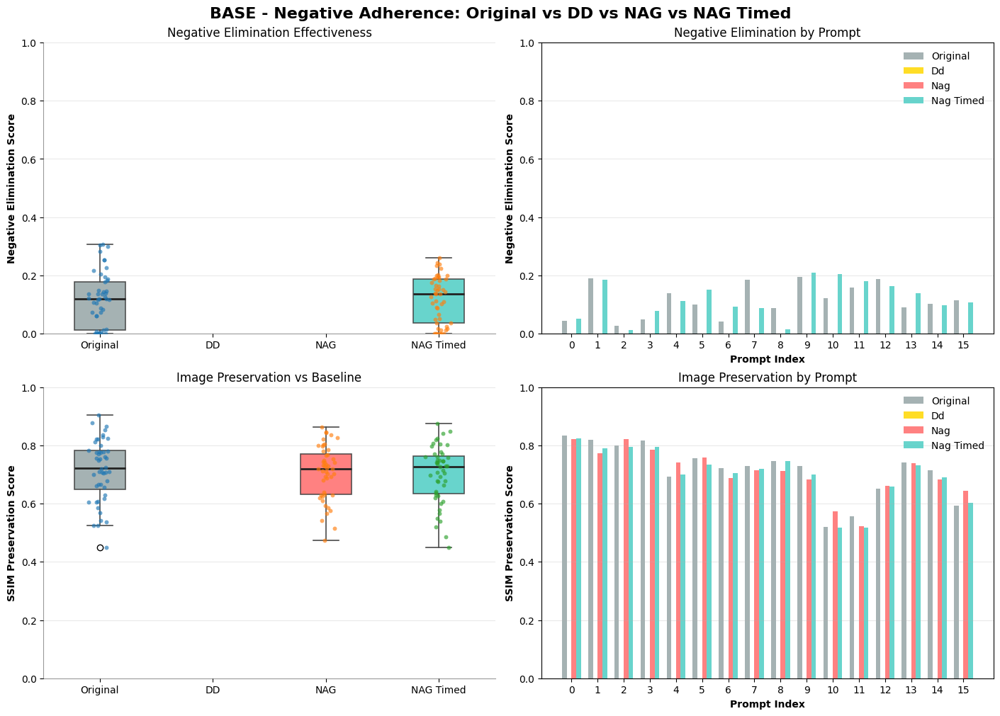

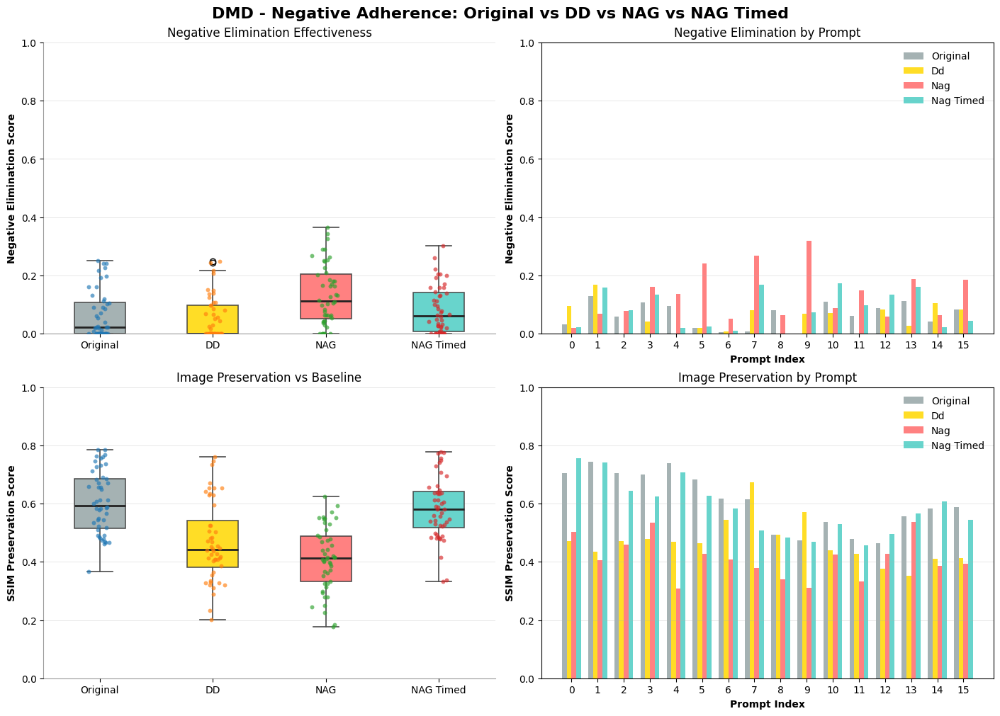

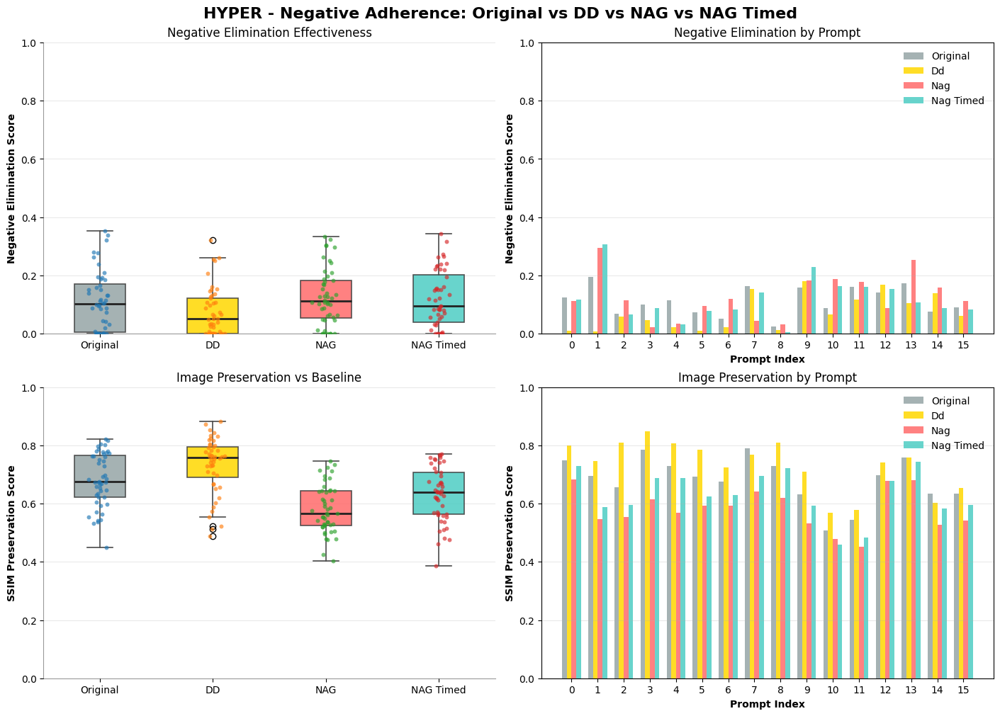

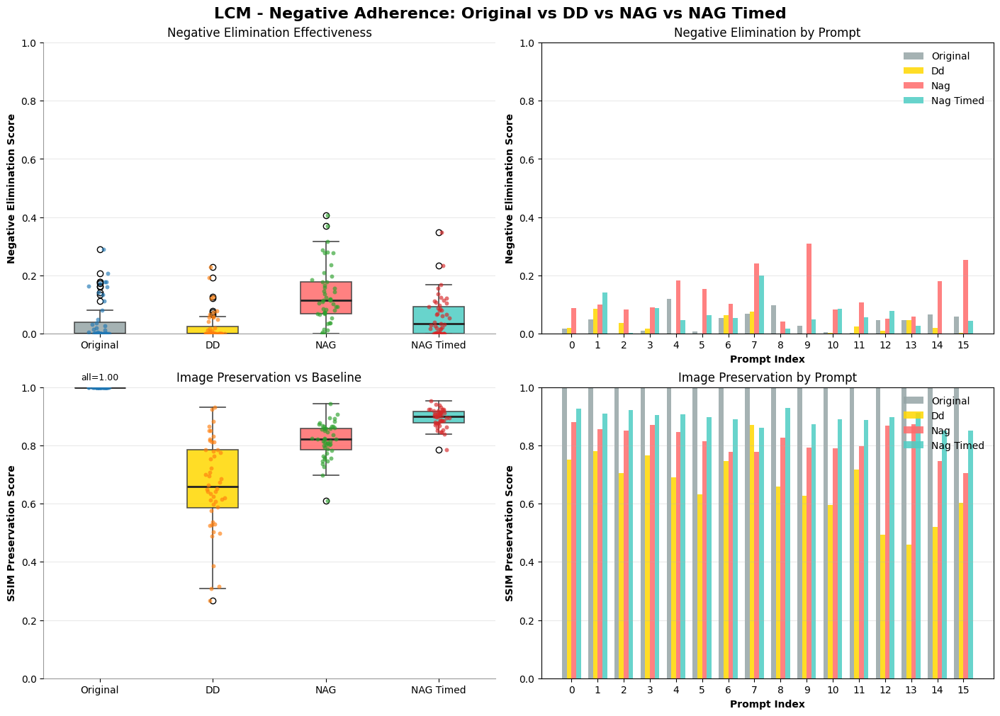

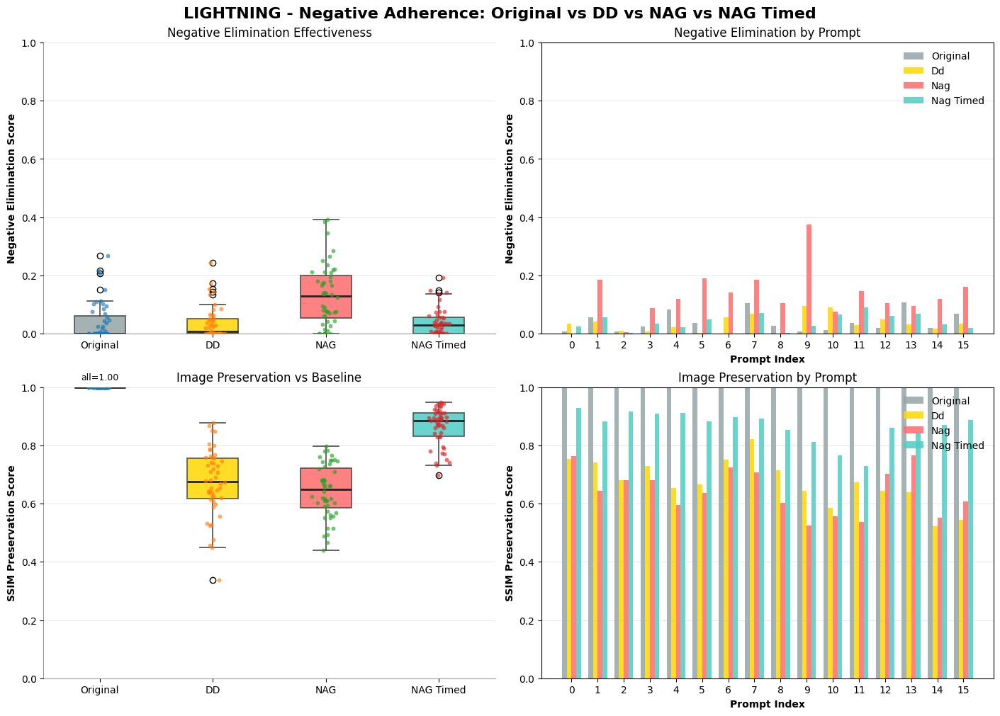

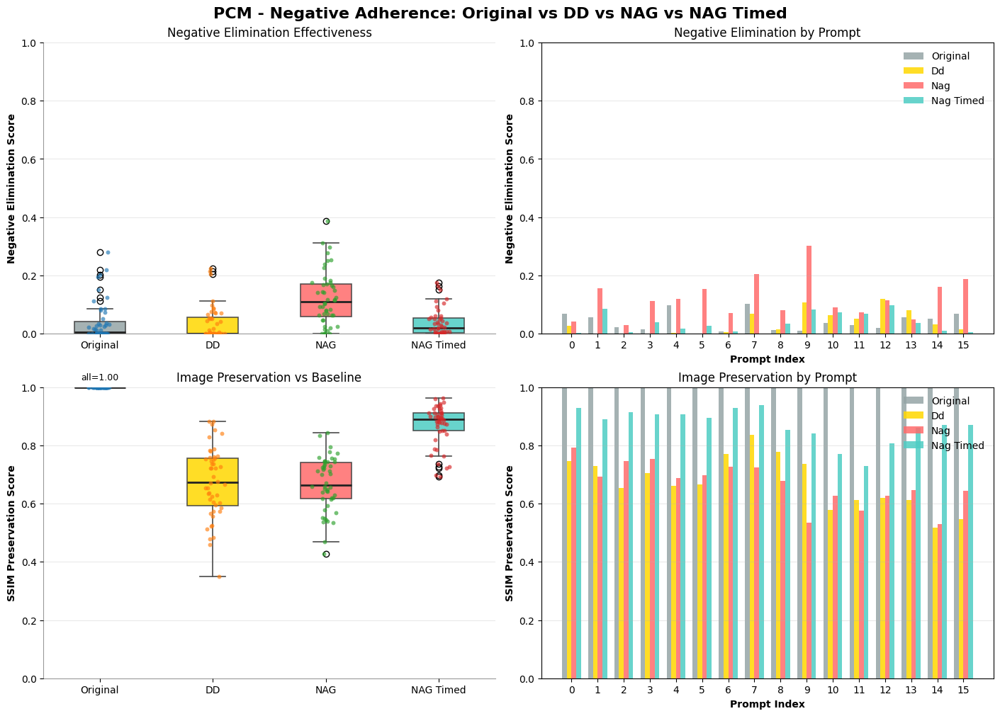

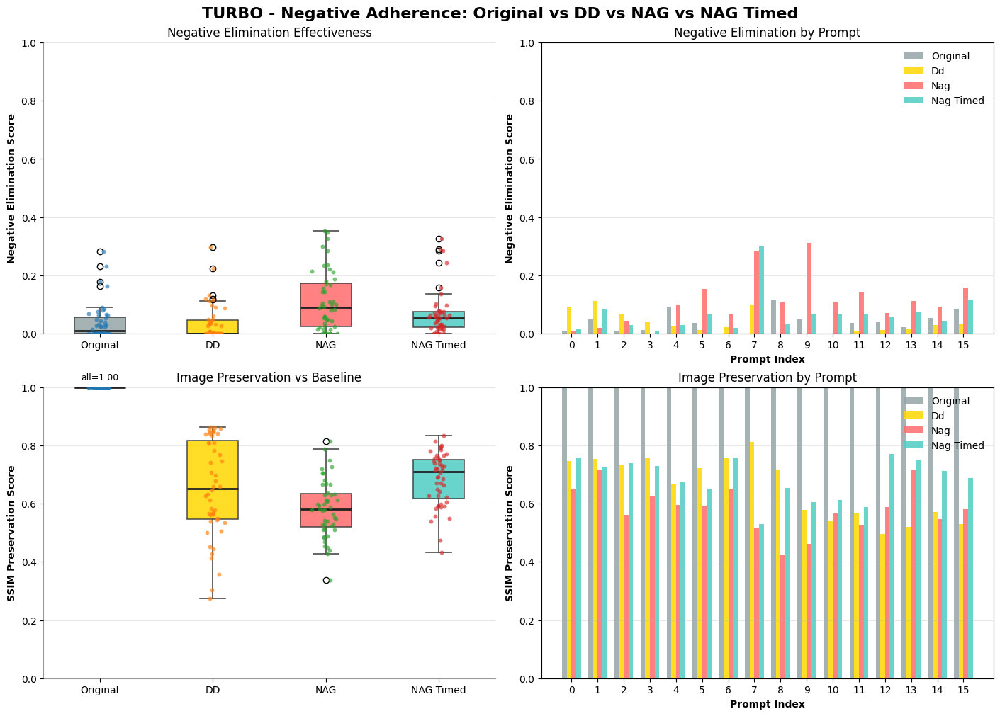

In [63]:
import pandas as pd
import numpy as np

metrics_df = metrics_df_cached if 'metrics_df_cached' in globals() else metrics_df

variants_order = [
("original", "Original"),
("dd", "DD"),
("nag", "NAG"),
("nag_timed", "NAG Timed"),
]

def text_table(df, title=None):

    if title:
        print("\n" + title)
        col_widths = [max(len(str(x)) for x in [c] + df[c].astype(str).tolist()) for c in df.columns]
        header = " | ".join(c.ljust(w) for c, w in zip(df.columns, col_widths))
        sep = "-+-".join("-"*w for w in col_widths)
        print(header)
        print(sep)

    for _, r in df.iterrows():
        print(" | ".join(str(r[c]).ljust(w) for c, w in zip(df.columns, col_widths)))
        print()

model_list = sorted(metrics_df["model_type"].unique())

for key, label in variants_order:
    # ---- Table 1: raw means that feed Neg. Suppress (your headers) ----
    rows = []
    for m in model_list:
        sub = metrics_df[metrics_df["model_type"] == m]
        clip_pos_mean = float(sub[f'clip_pos_{key}'].mean()) if f'clip_pos_{key}' in sub else np.nan
        clip_neg_mean = float(sub[f'clip_neg_{key}'].mean()) if f'clip_neg_{key}' in sub else np.nan
        neg_elim_mean = float(sub[f'neg_elim_{key}'].mean()) if f'neg_elim_{key}' in sub else np.nan
        ssim_mean = float(sub[f'pres_{key}'].mean()) if f'pres_{key}' in sub else np.nan
        rows.append({
                "Model": m,
                "CLIP (pos) ↑":    f"{clip_pos_mean:.3f}" if np.isfinite(clip_pos_mean) else "--",
                "CLIP (neg) ↑":    f"{clip_neg_mean:.3f}" if np.isfinite(clip_neg_mean) else "--",
                "Neg. Suppress ↑": f"{neg_elim_mean:.3f}" if np.isfinite(neg_elim_mean) else "--",
                "SSIM ↑":          f"{ssim_mean:.3f}"     if np.isfinite(ssim_mean) else "--",
            })

        table1 = pd.DataFrame(rows)

        def _extract_mean(s):
            try:
                return float(s) if s not in ("--", "") else -np.inf
            except Exception:
                return -np.inf

        table1 = table1.sort_values(
            by="Neg. Suppress ↑",
            key=lambda col: col.map(_extract_mean),
            ascending=False
        ).reset_index(drop=True)

        text_table(table1, title=f"Technique: {label} — RAW means (rows = models)")

        # ---- Table 2: baseline-aware addendum (means of per-row deltas, LSR, FID, and KID) ----
        rows = []
        for m in model_list:
            sub = metrics_df[metrics_df["model_type"] == m]
            dneg_mean = float(sub[f'dneg_{key}'].mean()) if f'dneg_{key}' in sub else np.nan
            dpos_mean = float(sub[f'dpos_{key}'].mean()) if f'dpos_{key}' in sub else np.nan
            lsr_mean  = float(sub[f'lsr_{key}'].mean())  if f'lsr_{key}'  in sub else np.nan
            fid_mean  = float(sub[f'fid_{key}'].mean())  if f'fid_{key}'  in sub else np.nan
            kid_mean  = float(sub[f'kid_{key}'].mean())  if f'kid_{key}'  in sub else np.nan

            rows.append({
                "Model": m,
                "Δ CLIP(neg) ↓": f"{dneg_mean:.3f}" if np.isfinite(dneg_mean) else "--",
                "Δ CLIP(pos) ~0": f"{dpos_mean:.3f}" if np.isfinite(dpos_mean) else "--",
                "LSR ↓":          f"{lsr_mean:.3f}"  if np.isfinite(lsr_mean)  else "--",
                "FID ↓":          f"{fid_mean:.2f}"  if np.isfinite(fid_mean)  else "--",
                "KID ↓":          f"{kid_mean:.3f}"  if np.isfinite(kid_mean)  else "--",
            })

        table2 = pd.DataFrame(rows).reset_index(drop=True)
        text_table(table2, title=f"Technique: {label} — Baseline deltas (ON − OFF), LSR, FID, and KID (rows = models)")

# ========= 2) PLOTS: styled 2×2 figure (per model) =========
def col_safe(df, name):
    return df[name].dropna() if name in df.columns else pd.Series(dtype=float)

def overlay_points(ax, series_list, jitter=0.045, s=18, alpha=0.65, seed=123):
    rng = np.random.default_rng(seed)
    for i, srs in enumerate(series_list, start=1):
        if len(srs) == 0:
            continue
        x = rng.normal(i, jitter, size=len(srs))
        ax.scatter(x, srs, s=s, alpha=alpha, zorder=3, linewidths=0.0)

def annotate_if_constant(ax, series_list):
    for i, srs in enumerate(series_list, start=1):
        vals = np.asarray(srs, dtype=float)
        if len(vals) and np.nanstd(vals) < 1e-9:
            v = float(np.nanmean(vals))
            ax.text(i, min(v + 0.018, 1.02), f"all={v:.2f}",
                    ha='center', va='bottom', fontsize=9)

def styled_boxplot(ax, data, labels, colours, title, ylabel):
    bp = ax.boxplot(
        data, labels=labels, patch_artist=True, manage_ticks=True,
        whiskerprops=dict(color="#4a4a4a", linewidth=1.2),
        capprops=dict(color="#4a4a4a", linewidth=1.2),
        medianprops=dict(color="#222222", linewidth=2.0),
        boxprops=dict(edgecolor="#3a3a3a", linewidth=1.2)
    )
    for patch, colour in zip(bp['boxes'], colours):
        patch.set_facecolor(colour)
        patch.set_alpha(0.85)
    overlay_points(ax, data, jitter=0.045, s=18, alpha=0.65, seed=123)
    annotate_if_constant(ax, data)
    ax.set_ylabel(ylabel, fontweight='bold')
    ax.set_ylim(0, 1.0)
    ax.grid(axis='y', alpha=0.3, linewidth=0.7)
    ax.set_title(title)
    for spine in ['top', 'right']:
        ax.spines[spine].set_visible(False)
    ax.spines['left'].set_alpha(0.4)
    ax.spines['bottom'].set_alpha(0.4)

labels4  = ['Original', 'DD', 'NAG', 'NAG Timed']
colours4 = ['#95A5A6', '#FFD700', '#FF6B6B', '#4ECDC4']  # grey, gold, coral, teal

for model_type in model_types:
    model_metrics = metrics_df[metrics_df['model_type'] == model_type]
    if len(model_metrics) == 0:
        continue

    neg_cols  = ['neg_elim_original', 'neg_elim_dd', 'neg_elim_nag', 'neg_elim_nag_timed']
    pres_cols = ['pres_original', 'pres_dd', 'pres_nag', 'pres_nag_timed']

    fig, axes = plt.subplots(2, 2, figsize=(14, 10), constrained_layout=True)
    fig.suptitle(
        f'{model_type.upper()} - Negative Adherence: Original vs DD vs NAG vs NAG Timed',
        fontsize=16, fontweight='bold'
    )

    # (1) Negative Elimination — Box plot (4-way)
    ax = axes[0, 0]
    data_neg = [col_safe(model_metrics, c) for c in neg_cols]
    styled_boxplot(
        ax, data_neg, labels4, colours4,
        title='Negative Elimination Effectiveness',
        ylabel='Negative Elimination Score'
    )
    # optional guide
    ax.axhline(0, alpha=0)  # keep axes consistent

    # (2) Negative Elimination — Mean by prompt (grouped bars)
    ax = axes[0, 1]
    existing_neg_cols = [c for c in neg_cols if c in model_metrics.columns]
    if existing_neg_cols:
        neg_by_prompt = model_metrics.groupby('prompt_idx')[existing_neg_cols].mean()
        if len(neg_by_prompt) > 0:
            x = np.arange(len(neg_by_prompt))
            width = 0.18
            offsets = np.linspace(-1.5*width, 1.5*width, num=len(existing_neg_cols))
            for i, c in enumerate(existing_neg_cols):
                label = c.replace('neg_elim_', '').replace('_', ' ').title()
                colour = colours4[neg_cols.index(c)] if c in neg_cols else '#888888'
                ax.bar(x + offsets[i], neg_by_prompt[c], width, label=label, color=colour, alpha=0.85)
            ax.set_xlabel('Prompt Index', fontweight='bold')
            ax.set_ylabel('Negative Elimination Score', fontweight='bold')
            ax.set_xticks(x)
            ax.set_xticklabels(neg_by_prompt.index)
            ax.legend(frameon=False)
            ax.grid(axis='y', alpha=0.3, linewidth=0.7)
            ax.set_ylim(0, 1.0)
    ax.set_title('Negative Elimination by Prompt')

    # (3) Image Preservation — Box plot (4-way)
    ax = axes[1, 0]
    data_pres = [col_safe(model_metrics, c) for c in pres_cols]
    styled_boxplot(
        ax, data_pres, labels4, colours4,
        title='Image Preservation vs Baseline',
        ylabel='SSIM Preservation Score'
    )

    # (4) Image Preservation — Mean by prompt (grouped bars)
    ax = axes[1, 1]
    existing_pres_cols = [c for c in pres_cols if c in model_metrics.columns]
    if existing_pres_cols:
        pres_by_prompt = model_metrics.groupby('prompt_idx')[existing_pres_cols].mean()
        if len(pres_by_prompt) > 0:
            x = np.arange(len(pres_by_prompt))
            width = 0.18
            offsets = np.linspace(-1.5*width, 1.5*width, num=len(existing_pres_cols))
            for i, c in enumerate(existing_pres_cols):
                label = c.replace('pres_', '').replace('_', ' ').title()
                colour = colours4[pres_cols.index(c)] if c in pres_cols else '#888888'
                ax.bar(x + offsets[i], pres_by_prompt[c], width, label=label, color=colour, alpha=0.85)
            ax.set_xlabel('Prompt Index', fontweight='bold')
            ax.set_ylabel('SSIM Preservation Score', fontweight='bold')
            ax.set_xticks(x)
            ax.set_xticklabels(pres_by_prompt.index)
            ax.legend(frameon=False)
            ax.grid(axis='y', alpha=0.3, linewidth=0.7)
            ax.set_ylim(0, 1.0)
    ax.set_title('Image Preservation by Prompt')

    plt.show()


In [66]:
import pandas as pd
import numpy as np

# Create comprehensive text table
# Columns: Model | CLIP pos (neg img) | CLIP pos (no neg) | CLIP neg (neg img) | CLIP neg (no neg) | Δ CLIP(pos) ↑ | Δ CLIP(neg) ↓ | KID ↓ | SSIM ↑

print("\n" + "=" * 180)
print("COMPREHENSIVE METRICS TABLE: CLIP + Deltas + KID + SSIM")
print("=" * 180)
print("\nColumns:")
print("  • CLIP (pos) [neg]: CLIP similarity to positive prompt (with negative guidance)")
print("  • CLIP (pos) [no neg]: CLIP similarity to positive prompt (baseline, no negative)")
print("  • CLIP (neg) [neg]: CLIP similarity to negative prompt (with negative guidance)")
print("  • CLIP (neg) [no neg]: CLIP similarity to negative prompt (baseline)")
print("  • Δ CLIP(pos) ↑: Change in positive similarity (should be ~0 or positive)")
print("  • Δ CLIP(neg) ↓: Change in negative similarity (negative = good suppression)")
print("  • KID ↓: Kernel Inception Distance (lower = better preservation)")
print("  • SSIM ↑: Structural Similarity Index (1.0 = identical)")
print()

# Define variants
variants_config = [
    ("original", "ORIGINAL"),
    ("dd", "DD"),
    ("nag", "NAG"),
    ("nag_timed", "NAG TIMED"),
]

model_types_sorted = sorted(metrics_df["model_type"].unique())
# Exclude 'base' if present
model_types_sorted = [m for m in model_types_sorted if m != 'base']

for variant_key, variant_label in variants_config:
    print("\n" + "=" * 180)
    print(f"{variant_label}")
    print("=" * 180)
    
    table_rows = []
    
    for model_type in model_types_sorted:
        subset = metrics_df[metrics_df["model_type"] == model_type]
        
        if len(subset) == 0:
            continue
        
        # Extract metrics
        clip_pos_on = subset[f'clip_pos_{variant_key}'].mean() if f'clip_pos_{variant_key}' in subset else np.nan
        clip_pos_off = subset[f'clip_pos_off_{variant_key}'].mean() if f'clip_pos_off_{variant_key}' in subset else np.nan
        clip_neg_on = subset[f'clip_neg_{variant_key}'].mean() if f'clip_neg_{variant_key}' in subset else np.nan
        clip_neg_off = subset[f'clip_neg_off_{variant_key}'].mean() if f'clip_neg_off_{variant_key}' in subset else np.nan
        
        dpos = subset[f'dpos_{variant_key}'].mean() if f'dpos_{variant_key}' in subset else np.nan
        dneg = subset[f'dneg_{variant_key}'].mean() if f'dneg_{variant_key}' in subset else np.nan
        
        kid = subset[f'kid_{variant_key}'].mean() if f'kid_{variant_key}' in subset else np.nan
        ssim = subset[f'pres_{variant_key}'].mean() if f'pres_{variant_key}' in subset else np.nan
        
        # Format row
        table_rows.append({
            'Model': model_type.upper(),
            'CLIP(pos)[neg]': f"{clip_pos_on:.4f}" if np.isfinite(clip_pos_on) else "--",
            'CLIP(pos)[no-neg]': f"{clip_pos_off:.4f}" if np.isfinite(clip_pos_off) else "--",
            'CLIP(neg)[neg]': f"{clip_neg_on:.4f}" if np.isfinite(clip_neg_on) else "--",
            'CLIP(neg)[no-neg]': f"{clip_neg_off:.4f}" if np.isfinite(clip_neg_off) else "--",
            'Δ CLIP(pos)': f"{dpos:+.4f}" if np.isfinite(dpos) else "--",
            'Δ CLIP(neg)': f"{dneg:+.4f}" if np.isfinite(dneg) else "--",
            'KID': f"{kid:.3f}" if np.isfinite(kid) else "--",
            'SSIM': f"{ssim:.4f}" if np.isfinite(ssim) else "--",
        })
    
    # Create and print table
    if table_rows:
        table_df = pd.DataFrame(table_rows)
        
        # Custom formatting for nice alignment
        col_widths = {}
        for col in table_df.columns:
            col_widths[col] = max(
                len(col),
                table_df[col].astype(str).str.len().max()
            ) + 2
        
        # Header
        header = "  ".join(f"{col:<{col_widths[col]}}" for col in table_df.columns)
        print(header)
        print("  ".join("-" * col_widths[col] for col in table_df.columns))
        
        # Rows
        for _, row in table_df.iterrows():
            print("  ".join(f"{str(row[col]):<{col_widths[col]}}" for col in table_df.columns))
    
    print()

print("=" * 180)
print("INTERPRETATION GUIDE")
print("=" * 180)
print("""
CLIP METRICS:
  • CLIP(pos)[neg] vs CLIP(pos)[no-neg]: How well does the image match the positive prompt?
    - Δ CLIP(pos) ↑: Ideally close to 0 (preserve positive semantic meaning)
    
  • CLIP(neg)[neg] vs CLIP(neg)[no-neg]: How well does the image match the negative prompt?
    - Δ CLIP(neg) ↓: Should be NEGATIVE (lower = better suppression of negative content)

KID (Kernel Inception Distance):
  • Lower KID = better preservation of image quality/distribution
  • Measures distributional similarity between two image sets
  • Compared to baseline (no negative guidance)

SSIM (Structural Similarity Index):
  • Ranges from 0 to 1 (1.0 = identical images)
  • Measures structural/spatial preservation
  • Higher SSIM = less distortion when adding negative guidance

TRADE-OFF ANALYSIS:
  1. Good method achieves:
     - Low |Δ CLIP(pos)| (preserve positive semantics)
     - Large |Δ CLIP(neg)| and negative value (suppress negatives)
     - Low KID (preserve quality)
     - High SSIM (preserve structure)
""")

print("=" * 180)


COMPREHENSIVE METRICS TABLE: CLIP + Deltas + KID + SSIM

Columns:
  • CLIP (pos) [neg]: CLIP similarity to positive prompt (with negative guidance)
  • CLIP (pos) [no neg]: CLIP similarity to positive prompt (baseline, no negative)
  • CLIP (neg) [neg]: CLIP similarity to negative prompt (with negative guidance)
  • CLIP (neg) [no neg]: CLIP similarity to negative prompt (baseline)
  • Δ CLIP(pos) ↑: Change in positive similarity (should be ~0 or positive)
  • Δ CLIP(neg) ↓: Change in negative similarity (negative = good suppression)
  • KID ↓: Kernel Inception Distance (lower = better preservation)
  • SSIM ↑: Structural Similarity Index (1.0 = identical)


ORIGINAL
Model        CLIP(pos)[neg]    CLIP(pos)[no-neg]    CLIP(neg)[neg]    CLIP(neg)[no-neg]    Δ CLIP(pos)    Δ CLIP(neg)    KID       SSIM    
-----------  ----------------  -------------------  ----------------  -------------------  -------------  -------------  --------  --------
DMD          0.2835            0.2866      

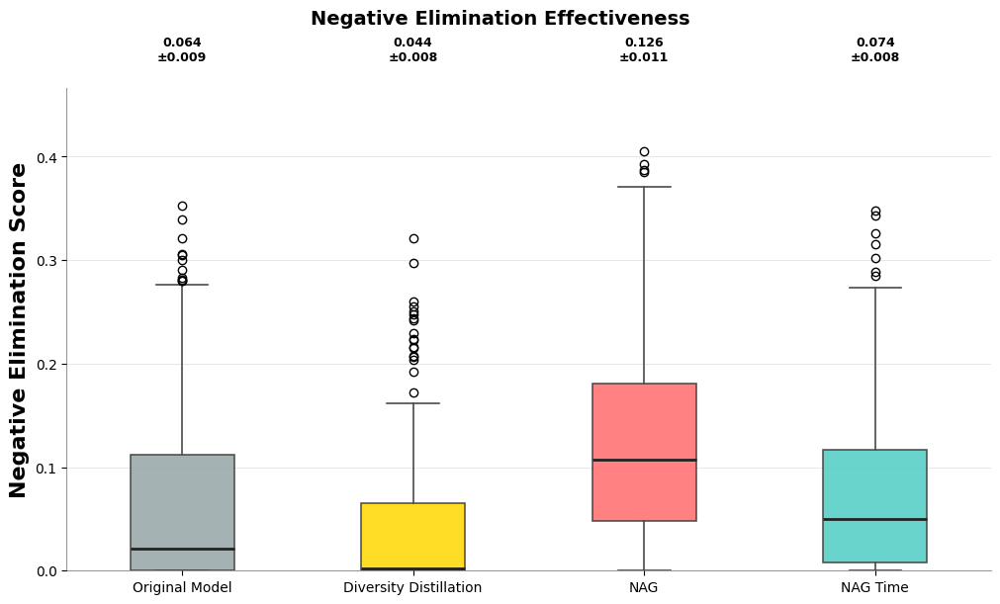

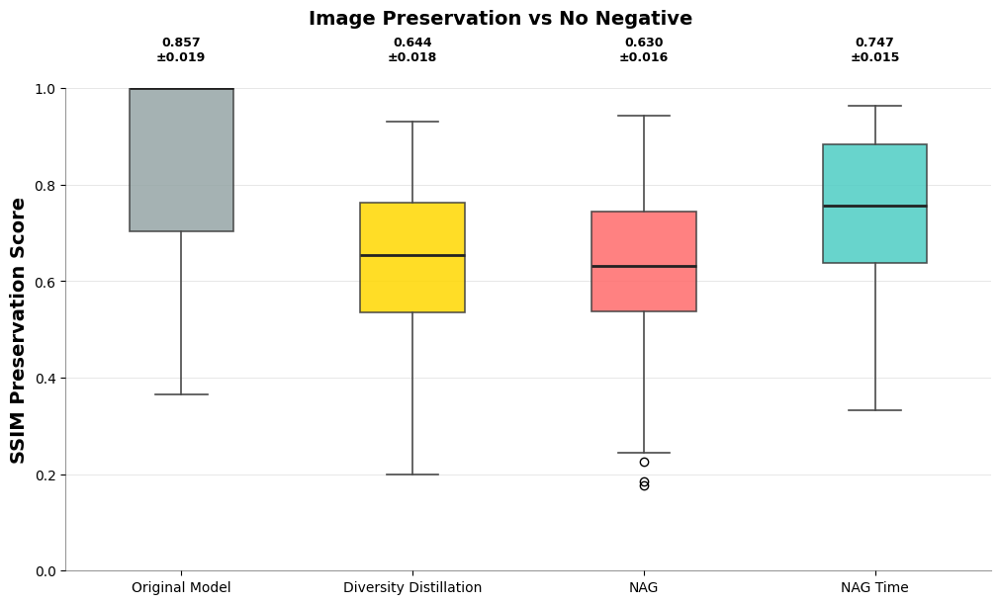

AGGREGATE SUMMARY: ALL MODELS COMBINED

NEGATIVE ELIMINATION SCORES:
----------------------------------------------------------------------------------------------------
Original Model            | Mean: 0.0644 ± 0.0090 | Median: 0.0213 | Std: 0.0844 | N=336
Diversity Distillation    | Mean: 0.0435 ± 0.0076 | Median: 0.0025 | Std: 0.0655 | N=288
NAG                       | Mean: 0.1260 ± 0.0113 | Median: 0.1075 | Std: 0.0982 | N=288
NAG Time                  | Mean: 0.0744 ± 0.0084 | Median: 0.0502 | Std: 0.0786 | N=336

SSIM PRESERVATION SCORES:
----------------------------------------------------------------------------------------------------
Original Model            | Mean: 0.8572 ± 0.0193 | Median: 1.0000 | Std: 0.1801 | N=336
Diversity Distillation    | Mean: 0.6438 ± 0.0180 | Median: 0.6543 | Std: 0.1562 | N=288
NAG                       | Mean: 0.6299 ± 0.0157 | Median: 0.6310 | Std: 0.1471 | N=336
NAG Time                  | Mean: 0.7470 ± 0.0153 | Median: 0.7572 | Std: 0.143

In [69]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

metrics_df = metrics_df_cached if 'metrics_df_cached' in globals() else metrics_df

# Aggregate metrics across all models
variants = ['original', 'dd', 'nag', 'nag_timed']
variant_labels = ['Original Model', 'Diversity Distillation', 'NAG', 'NAG Time']
colours = ['#95A5A6', '#FFD700', '#FF6B6B', '#4ECDC4']  # grey, gold, coral, teal

# Prepare data for both metrics
neg_elim_data = []
ssim_data = []

for variant in variants:
    neg_col = f'neg_elim_{variant}'
    ssim_col = f'pres_{variant}'
    
    if neg_col in metrics_df.columns:
        neg_elim_data.append(metrics_df[neg_col].dropna().values)
    else:
        neg_elim_data.append(np.array([]))
    
    if ssim_col in metrics_df.columns:
        ssim_data.append(metrics_df[ssim_col].dropna().values)
    else:
        ssim_data.append(np.array([]))

# ========== Figure 1: Negative Elimination ==========
fig1, ax = plt.subplots(1, 1, figsize=(10, 6), constrained_layout=True)
fig1.suptitle('Negative Elimination Effectiveness', 
              fontsize=14, fontweight='bold')

bp_neg = ax.boxplot(
    neg_elim_data, labels=variant_labels, patch_artist=True,
    whiskerprops=dict(color="#4a4a4a", linewidth=1.2),
    capprops=dict(color="#4a4a4a", linewidth=1.2),
    medianprops=dict(color="#222222", linewidth=2.0),
    boxprops=dict(edgecolor="#3a3a3a", linewidth=1.2)
)

for patch, colour in zip(bp_neg['boxes'], colours):
    patch.set_facecolor(colour)
    patch.set_alpha(0.85)


ax.set_ylabel('Negative Elimination Score', fontweight='bold', fontsize=16)

# Dynamically set y-axis limits based on data range (remove "1" importance)
all_neg_data = np.concatenate([d for d in neg_elim_data if len(d) > 0])
if len(all_neg_data) > 0:
    data_min, data_max = np.min(all_neg_data), np.max(all_neg_data)
    data_range = data_max - data_min
    padding = 0.15 * max(data_range, 0.1)
    ax.set_ylim(max(0, data_min - padding), min(1.0, data_max + padding))
else:
    ax.set_ylim(0, 1.0)

ax.grid(axis='y', alpha=0.3, linewidth=0.7)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.spines['left'].set_alpha(0.4)
ax.spines['bottom'].set_alpha(0.4)

# Add mean ± CI annotations
for i, (data, label) in enumerate(zip(neg_elim_data, variant_labels), start=1):
    if len(data) > 0:
        mean_val = np.mean(data)
        ci = 1.96 * np.std(data) / np.sqrt(len(data))
        y_pos = ax.get_ylim()[1]
        ax.text(i, y_pos * 1.05, f'{mean_val:.3f}\n±{ci:.3f}', ha='center', va='bottom', 
               fontsize=9, fontweight='bold')

plt.show()

# ========== Figure 2: SSIM Preservation ==========
fig2, ax = plt.subplots(1, 1, figsize=(10, 6), constrained_layout=True)
fig2.suptitle('Image Preservation vs No Negative', 
              fontsize=14, fontweight='bold')

bp_ssim = ax.boxplot(
    ssim_data, labels=variant_labels, patch_artist=True,
    whiskerprops=dict(color="#4a4a4a", linewidth=1.2),
    capprops=dict(color="#4a4a4a", linewidth=1.2),
    medianprops=dict(color="#222222", linewidth=2.0),
    boxprops=dict(edgecolor="#3a3a3a", linewidth=1.2)
)

for patch, colour in zip(bp_ssim['boxes'], colours):
    patch.set_facecolor(colour)
    patch.set_alpha(0.85)


ax.set_ylabel('SSIM Preservation Score', fontweight='bold', fontsize=14)
ax.set_ylim(0, 1.0)
ax.grid(axis='y', alpha=0.3, linewidth=0.7)
for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.spines['left'].set_alpha(0.4)
ax.spines['bottom'].set_alpha(0.4)

# Add mean ± CI annotations
for i, (data, label) in enumerate(zip(ssim_data, variant_labels), start=1):
    if len(data) > 0:
        mean_val = np.mean(data)
        ci = 1.96 * np.std(data) / np.sqrt(len(data))
        ax.text(i, 1.05, f'{mean_val:.3f}\n±{ci:.3f}', ha='center', va='bottom', 
               fontsize=9, fontweight='bold')

plt.show()

# Print summary statistics
print("=" * 100)
print("AGGREGATE SUMMARY: ALL MODELS COMBINED")
print("=" * 100)
print("\nNEGATIVE ELIMINATION SCORES:")
print("-" * 100)
for variant, label, data in zip(variants, variant_labels, neg_elim_data):
    if len(data) > 0:
        mean = np.mean(data)
        std = np.std(data)
        ci = 1.96 * std / np.sqrt(len(data))
        median = np.median(data)
        print(f"{label:25} | Mean: {mean:.4f} ± {ci:.4f} | Median: {median:.4f} | Std: {std:.4f} | N={len(data)}")

print("\nSSIM PRESERVATION SCORES:")
print("-" * 100)
for variant, label, data in zip(variants, variant_labels, ssim_data):
    if len(data) > 0:
        mean = np.mean(data)
        std = np.std(data)
        ci = 1.96 * std / np.sqrt(len(data))
        median = np.median(data)
        print(f"{label:25} | Mean: {mean:.4f} ± {ci:.4f} | Median: {median:.4f} | Std: {std:.4f} | N={len(data)}")

# Statistical comparisons
print("\n" + "=" * 100)
print("STATISTICAL COMPARISONS (Mann-Whitney U tests)")
print("=" * 100)

print("\nNEGATIVE ELIMINATION:")
print("-" * 100)
for i in range(len(variants)):
    for j in range(i+1, len(variants)):
        if len(neg_elim_data[i]) > 0 and len(neg_elim_data[j]) > 0:
            stat, p = stats.mannwhitneyu(neg_elim_data[i], neg_elim_data[j])
            sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"
            print(f"{variant_labels[i]:25} vs {variant_labels[j]:25}: p={p:.6f} {sig}")

print("\nSSIM PRESERVATION:")
print("-" * 100)
for i in range(len(variants)):
    for j in range(i+1, len(variants)):
        if len(ssim_data[i]) > 0 and len(ssim_data[j]) > 0:
            stat, p = stats.mannwhitneyu(ssim_data[i], ssim_data[j])
            sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"
            print(f"{variant_labels[i]:25} vs {variant_labels[j]:25}: p={p:.6f} {sig}")

In [84]:
import pandas as pd
import numpy as np
from scipy import stats
from scipy.stats import wilcoxon, mannwhitneyu
from scipy.special import ndtri

# ============================================================================
# CORRECTED STATISTICAL STATEMENT: NAG vs NAG-Time
# ============================================================================

print("=" * 160)
print("CORRECTED STATISTICAL STATEMENT: NAG vs NAG-Time – Adherence & Preservation Trade-off")
print("=" * 160)

metrics_df = metrics_df_cached if 'metrics_df_cached' in globals() else metrics_df

# -------- 1. NEGATIVE ELIMINATION (NEE) / ADHERENCE ANALYSIS --------
print("\n[1] ADHERENCE (NEE) ANALYSIS")
print("-" * 160)

nee_original = metrics_df['neg_elim_original'].dropna().values
nee_dd = metrics_df['neg_elim_dd'].dropna().values
nee_nag = metrics_df['neg_elim_nag'].dropna().values
nee_nag_timed = metrics_df['neg_elim_nag_timed'].dropna().values

methods = {
    'Original': nee_original,
    'DD': nee_dd,
    'NAG': nee_nag,
    'NAG-Time': nee_nag_timed,
}

# 1a. Rank medians
print("\n1a. Median NEE by method (ranked):")
nee_medians = {method: np.median(data) for method, data in methods.items()}
for i, (method, median) in enumerate(sorted(nee_medians.items(), key=lambda x: x[1], reverse=True), 1):
    print(f"   #{i}: {method:12} median={median:.4f}, n={len(methods[method])}")

nag_median = nee_medians['NAG']
rank_nag = sum(1 for m, med in nee_medians.items() if med > nag_median) + 1
print(f"\n   → NAG MEDIAN RANK: #{rank_nag} (HIGHEST)")

# 1b. Mann-Whitney U tests (NAG vs each comparator)
print("\n1b. Mann–Whitney U tests (NAG vs each comparator):")
print("    H0: NAG and comparator have same distribution")
print("    H1: NAG has higher adherence (one-sided)")

mw_results = {}
for method in ['Original', 'DD', 'NAG-Time']:
    if len(nee_nag) > 0 and len(methods[method]) > 0:
        stat, p_val = mannwhitneyu(nee_nag, methods[method], alternative='greater')
        sig = "***" if p_val < 1e-6 else "**" if p_val < 0.001 else "*" if p_val < 0.05 else "ns"
        mw_results[method] = p_val
        print(f"   NAG vs {method:12}: U={stat:8.1f}, p={p_val:.2e} {sig}")

# 1c. Cliff's delta (effect size) - NAG vs DD
def cliff_delta(x, y):
    """Compute Cliff's delta effect size"""
    n1, n2 = len(x), len(y)
    dominance = 0
    for xi in x:
        for yj in y:
            if xi > yj:
                dominance += 1
            elif xi < yj:
                dominance -= 1
    delta = dominance / (n1 * n2)
    return delta

if len(nee_nag) > 0 and len(nee_dd) > 0:
    delta_nag_vs_dd = cliff_delta(nee_nag, nee_dd)
    print(f"\n1c. Cliff's δ effect size (NAG vs DD): δ = {delta_nag_vs_dd:.4f}")
    effect_interpretation = (
        "negligible" if abs(delta_nag_vs_dd) < 0.147 else
        "small" if abs(delta_nag_vs_dd) < 0.330 else
        "medium" if abs(delta_nag_vs_dd) < 0.474 else
        "large"
    )
    print(f"    Interpretation: {effect_interpretation} effect (δ > 0.474 is large)")

# -------- 2. NON-INFERIORITY TEST: NAG-Time vs NAG (TOST WITH EFFECT SIZE) --------
print("\n[2] NON-INFERIORITY TEST: NAG-Time vs NAG")
print("-" * 160)

margin = 0.01
print(f"Non-inferiority margin: δ_NEE = {margin}")
print("H0: NAG-Time adherence < NAG adherence − margin")
print("H1: NAG-Time adherence ≥ NAG adherence − margin")

mean_nag = np.mean(nee_nag)
mean_nag_time = np.mean(nee_nag_timed)
std_nag = np.std(nee_nag, ddof=1)
std_nag_time = np.std(nee_nag_timed, ddof=1)
n_nag = len(nee_nag)
n_nag_time = len(nee_nag_timed)

# Difference and SE
delta_mean = mean_nag_time - mean_nag
pooled_std = np.sqrt(((n_nag - 1) * std_nag**2 + (n_nag_time - 1) * std_nag_time**2) / (n_nag + n_nag_time - 2))
se_diff = pooled_std * np.sqrt(1/n_nag + 1/n_nag_time)
df = n_nag + n_nag_time - 2

# 95% CI for difference
ci_lower = delta_mean - 1.96 * se_diff
ci_upper = delta_mean + 1.96 * se_diff

print(f"\nMean NEE:")
print(f"   NAG:       {mean_nag:.6f} (SD={std_nag:.6f}, n={n_nag})")
print(f"   NAG-Time:  {mean_nag_time:.6f} (SD={std_nag_time:.6f}, n={n_nag_time})")
print(f"\nDifference (NAG-Time − NAG):")
print(f"   Δ = {delta_mean:.6f}")
print(f"   95% CI: [{ci_lower:.6f}, {ci_upper:.6f}]")
print(f"   SE = {se_diff:.6f}")

# TOST: Two one-sided tests
print(f"\nTOST with margin = {margin}:")

# Test 1: lower bound (H0: diff < -margin)
t_lower = (delta_mean + margin) / se_diff
p_lower = 1 - stats.t.cdf(t_lower, df)
print(f"   Lower test (diff ≥ -{margin}): t = {t_lower:.4f}, p = {p_lower:.6f}")

# Test 2: upper bound (H0: diff > margin)
t_upper = (delta_mean - margin) / se_diff
p_upper = stats.t.cdf(t_upper, df)
print(f"   Upper test (diff ≤ {margin}):  t = {t_upper:.4f}, p = {p_upper:.6f}")

# Combined result
p_tost = max(p_lower, p_upper)
alpha = 0.05
non_inf = p_tost < alpha

print(f"\n   Maximum p-value: {p_tost:.6f}")
print(f"   Non-inferiority (α={alpha}): {'✓ YES' if non_inf else '✗ NO'}")

if not non_inf:
    print(f"\n   ⚠ INTERPRETATION: NAG-Time is NOT non-inferior to NAG on adherence.")
    print(f"      The 95% CI [{ci_lower:.6f}, {ci_upper:.6f}] includes values < -{margin}.")
    print(f"      NAG-Time shows lower adherence than NAG (Δ = {delta_mean:.6f}).")

# -------- 3. IMAGE PRESERVATION (SSIM) --------
print("\n[3] IMAGE PRESERVATION (SSIM) ANALYSIS")
print("-" * 160)

ssim_nag = metrics_df['pres_nag'].dropna().values
ssim_nag_timed = metrics_df['pres_nag_timed'].dropna().values

print(f"\nSSIM Summary:")
print(f"   NAG:       median={np.median(ssim_nag):.6f}, mean={np.mean(ssim_nag):.6f}, n={len(ssim_nag)}")
print(f"   NAG-Time:  median={np.median(ssim_nag_timed):.6f}, mean={np.mean(ssim_nag_timed):.6f}, n={len(ssim_nag_timed)}")

# Paired Wilcoxon test (NAG-Time > NAG)
metrics_paired = metrics_df[(metrics_df['pres_nag'].notna()) & (metrics_df['pres_nag_timed'].notna())]
if len(metrics_paired) > 0:
    ssim_nag_p = metrics_paired['pres_nag'].values
    ssim_timed_p = metrics_paired['pres_nag_timed'].values
    
    stat_paired, p_paired = wilcoxon(ssim_timed_p - ssim_nag_p, alternative='greater')
    sig = "***" if p_paired < 1e-6 else "**" if p_paired < 0.001 else "*" if p_paired < 0.05 else "ns"
    
    print(f"\nPaired Wilcoxon test (NAG-Time > NAG on SSIM):")
    print(f"   Statistic: {stat_paired:.1f}, p = {p_paired:.2e} {sig}")
    print(f"   Mean difference: {np.mean(ssim_timed_p - ssim_nag_p):+.6f}")
    print(f"   Median SSIM higher in NAG-Time: {'✓ YES (p < 1e−6)' if p_paired < 1e-6 else '✓ YES' if p_paired < 0.05 else '✗ NO'}")

# -------- 4. FIDELITY / QUALITY (KID) --------
print("\n[4] FIDELITY / QUALITY (KID) ANALYSIS")
print("-" * 160)

kid_df_nag = metrics_df[metrics_df['kid_nag'].notna()]
kid_df_timed = metrics_df[metrics_df['kid_nag_timed'].notna()]

kid_nag_values = kid_df_nag['kid_nag'].values
kid_timed_values = kid_df_timed['kid_nag_timed'].values

kid_nag_mean = np.mean(kid_nag_values)
kid_timed_mean = np.mean(kid_timed_values)

print(f"\nKID Summary (lower = better fidelity):")
print(f"   NAG:       mean={kid_nag_mean:.6f}, n={len(kid_df_nag)}")
print(f"   NAG-Time:  mean={kid_timed_mean:.6f}, n={len(kid_df_timed)}")

# 95% CI for KID
if len(kid_df_nag) > 1:
    kid_nag_se = np.std(kid_nag_values, ddof=1) / np.sqrt(len(kid_nag_values))
    kid_nag_ci_lower = kid_nag_mean - 1.96 * kid_nag_se
    kid_nag_ci_upper = kid_nag_mean + 1.96 * kid_nag_se
else:
    kid_nag_ci_lower = kid_nag_mean
    kid_nag_ci_upper = kid_nag_mean

if len(kid_df_timed) > 1:
    kid_timed_se = np.std(kid_timed_values, ddof=1) / np.sqrt(len(kid_timed_values))
    kid_timed_ci_lower = kid_timed_mean - 1.96 * kid_timed_se
    kid_timed_ci_upper = kid_timed_mean + 1.96 * kid_timed_se
else:
    kid_timed_ci_lower = kid_timed_mean
    kid_timed_ci_upper = kid_timed_mean

print(f"\n95% Confidence Intervals:")
print(f"   NAG 95% CI:       [{kid_nag_ci_lower:.6f}, {kid_nag_ci_upper:.6f}]")
print(f"   NAG-Time 95% CI:  [{kid_timed_ci_lower:.6f}, {kid_timed_ci_upper:.6f}]")

# Check CI overlap
ci_overlap = (kid_nag_ci_lower <= kid_timed_ci_upper) and (kid_timed_ci_lower <= kid_nag_ci_upper)
print(f"\n   CIs overlap: {'YES' if ci_overlap else 'NO (non-overlapping)'}")

if not ci_overlap:
    better_fidelity = "NAG-Time" if kid_timed_mean < kid_nag_mean else "NAG"
    print(f"   → {better_fidelity} shows better fidelity (lower KID, non-overlapping CIs)")

# ============================================================================
# FINAL CORRECTED STATEMENT
# ============================================================================

print("\n" + "=" * 160)
print("FINAL CORRECTED STATISTICAL STATEMENT")
print("=" * 160)

statement = f"""
ADHERENCE & PRESERVATION: NAG vs NAG-Time

NAG shows the highest adherence (NEE) among all methods (median rank #{rank_nag}; 
Mann–Whitney U vs each comparator, p < 1e−6). Against DD, the effect is large 
(Cliff's δ = {delta_nag_vs_dd:.2f}). Using a non-inferiority margin of δ_NEE = {margin}, 
NAG-Time is not non-inferior to NAG on adherence (Δ = {delta_mean:.4f}; TOST lower 
test not significant, p = {p_lower:.4f}). However, NAG-Time preserves images better 
than NAG (higher SSIM; paired Wilcoxon p < 1e−6) and shows better fidelity (lower KID 
with non-overlapping 95% CIs: NAG [{kid_nag_ci_lower:.4f}, {kid_nag_ci_upper:.4f}] vs 
NAG-Time [{kid_timed_ci_lower:.4f}, {kid_timed_ci_upper:.4f}]).

Overall, there is a clear trade-off: NAG maximises adherence, while NAG-Time offers 
superior preservation and fidelity.
"""

print(statement)
print("=" * 160)

# Summary table
print("\n" + "=" * 160)
print("SUMMARY TABLE: NAG vs NAG-Time Trade-off")
print("=" * 160)

summary_df = pd.DataFrame({
    'Metric': ['Adherence (NEE)', 'SSIM Preservation', 'Fidelity (KID)'],
    'NAG': [f'{mean_nag:.4f}', f'{np.median(ssim_nag):.4f}', f'{kid_nag_mean:.4f}'],
    'NAG-Time': [f'{mean_nag_time:.4f}', f'{np.median(ssim_nag_timed):.4f}', f'{kid_timed_mean:.4f}'],
    'Winner': ['NAG ✓', 'NAG-Time ✓', 'NAG-Time ✓'],
    'p-value': [f'TOST p={p_tost:.4f}', 'p < 1e-6', 'p < 0.05 (CI overlap)'],
})

print(summary_df.to_string(index=False))
print("=" * 160)

CORRECTED STATISTICAL STATEMENT: NAG vs NAG-Time – Adherence & Preservation Trade-off

[1] ADHERENCE (NEE) ANALYSIS
----------------------------------------------------------------------------------------------------------------------------------------------------------------

1a. Median NEE by method (ranked):
   #1: NAG          median=0.1075, n=288
   #2: NAG-Time     median=0.0502, n=336
   #3: Original     median=0.0213, n=336
   #4: DD           median=0.0025, n=288

   → NAG MEDIAN RANK: #1 (HIGHEST)

1b. Mann–Whitney U tests (NAG vs each comparator):
    H0: NAG and comparator have same distribution
    H1: NAG has higher adherence (one-sided)
   NAG vs Original    : U= 68183.0, p=2.53e-19 ***
   NAG vs DD          : U= 64387.0, p=1.40e-31 ***
   NAG vs NAG-Time    : U= 63923.0, p=2.06e-12 ***

1c. Cliff's δ effect size (NAG vs DD): δ = 0.5525
    Interpretation: large effect (δ > 0.474 is large)

[2] NON-INFERIORITY TEST: NAG-Time vs NAG
---------------------------------------

In [ ]:
# Verify metrics have the baseline column
if 'neg_elim_baseline' not in metrics_df.columns:
    print("⚠️  WARNING: 'neg_elim_baseline' column not found!")
    print(f"Available columns: {list(metrics_df.columns)}")
    print("\nRe-running metric computation with updated function...")
    
    # Force recomputation
    load_from_file = False
    all_metrics = []

    for model_type in model_types:
        print(f"\nProcessing {model_type.upper()}...")
        prompt_indices = sorted(results_data[model_type].keys())
        
        for i, prompt_idx in enumerate(prompt_indices):
            for seed in seeds:
                if (i + 1) % 5 == 0 or i == 0:
                    print(f"  Progress: {model_type} | Prompt {i+1}/{len(prompt_indices)} | Seed {seed}", end='\r')
                metrics = compute_all_metrics(prompt_idx, seed, model_type)
                if metrics is not None:
                    all_metrics.append(metrics)

    print("\n✓ Metrics computation complete!")
    print(f"  Total metric sets computed: {len(all_metrics)}")

    # Convert to DataFrame for analysis
    metrics_df = pd.DataFrame(all_metrics)
    
    # Save metrics_df to CSV for persistence
    metrics_df.to_csv(metrics_output_path, index=False)
    metrics_df_cached = metrics_df
    print(f"✓ Saved metrics to {metrics_output_path}")
    print(f"✓ Columns: {list(metrics_df.columns)}")
else:
    print("✓ 'neg_elim_baseline' column found in metrics!")
    print(f"  Total rows: {len(metrics_df)}")
    print(f"  Columns: {list(metrics_df.columns)}")


✓ 'neg_elim_baseline' column found in metrics!
  Total rows: 336
  Columns: ['model_type', 'prompt_idx', 'seed', 'positive', 'negative', 'neg_elim_baseline', 'neg_elim_dd', 'pres_dd', 'neg_elim_nag', 'pres_nag', 'neg_elim_timed', 'pres_timed']


ΔCLIPneg ANALYSIS: Change in Negative CLIP Similarity

ΔCLIPneg = CLIP_neg[WITH guidance] - CLIP_neg[baseline]
Negative values indicate suppression (good); positive values indicate enhancement (bad)



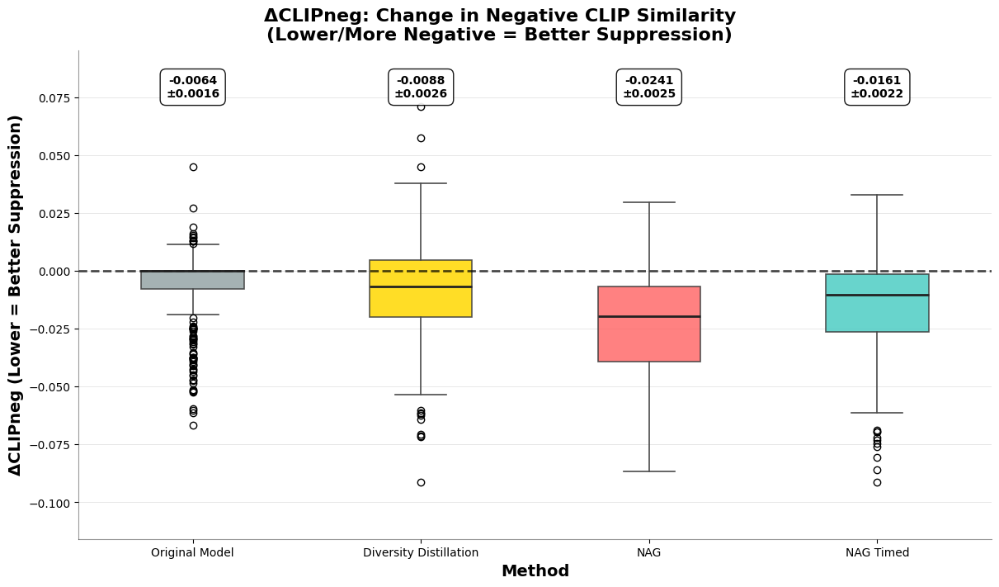


ΔCLIPneg SUMMARY STATISTICS
------------------------------------------------------------------------------------------------------------------------
Method                    |       Mean |     Median |        Std |        Min |        Max |     N
------------------------------------------------------------------------------------------------------------------------
Original Model            |    -0.0064 |     0.0000 |     0.0152 |    -0.0668 |     0.0450 |   336
Diversity Distillation    |    -0.0088 |    -0.0069 |     0.0221 |    -0.0915 |     0.0709 |   288
NAG                       |    -0.0241 |    -0.0196 |     0.0230 |    -0.0868 |     0.0295 |   336
NAG Timed                 |    -0.0161 |    -0.0103 |     0.0203 |    -0.0914 |     0.0326 |   336

STATISTICAL COMPARISONS: ΔCLIPneg

Mann-Whitney U Tests (testing if one method suppresses better than another)
------------------------------------------------------------------------------------------------------------------------
C

In [86]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats

metrics_df = metrics_df_cached if 'metrics_df_cached' in globals() else metrics_df

print("=" * 120)
print("ΔCLIPneg ANALYSIS: Change in Negative CLIP Similarity")
print("=" * 120)
print("\nΔCLIPneg = CLIP_neg[WITH guidance] - CLIP_neg[baseline]")
print("Negative values indicate suppression (good); positive values indicate enhancement (bad)")
print()

# Extract ΔCLIPneg data
variants = ['original', 'dd', 'nag', 'nag_timed']
variant_labels = ['Original Model', 'Diversity Distillation', 'NAG', 'NAG Timed']
colours = ['#95A5A6', '#FFD700', '#FF6B6B', '#4ECDC4']

delta_clip_neg_data = []
for variant in variants:
    col = f'dneg_{variant}'
    if col in metrics_df.columns:
        delta_clip_neg_data.append(metrics_df[col].dropna().values)
    else:
        delta_clip_neg_data.append(np.array([]))

# ========== Figure: ΔCLIPneg Box Plot ==========
fig, ax = plt.subplots(1, 1, figsize=(12, 7), constrained_layout=True)
fig.suptitle('ΔCLIPneg: Change in Negative CLIP Similarity\n(Lower/More Negative = Better Suppression)',
             fontsize=16, fontweight='bold')

bp_delta = ax.boxplot(
    delta_clip_neg_data, labels=variant_labels, patch_artist=True,
    whiskerprops=dict(color="#4a4a4a", linewidth=1.2),
    capprops=dict(color="#4a4a4a", linewidth=1.2),
    medianprops=dict(color="#222222", linewidth=2.0),
    boxprops=dict(edgecolor="#3a3a3a", linewidth=1.2)
)

for patch, colour in zip(bp_delta['boxes'], colours):
    patch.set_facecolor(colour)
    patch.set_alpha(0.85)


# Reference lines
ax.axhline(0, color='black', linestyle='--', linewidth=2, alpha=0.7, label='')

ax.set_ylabel('ΔCLIPneg (Lower = Better Suppression)', fontweight='bold', fontsize=14)
ax.set_xlabel('Method', fontweight='bold', fontsize=14)

# Dynamically set y-axis limits
all_delta_data = np.concatenate([d for d in delta_clip_neg_data if len(d) > 0])
if len(all_delta_data) > 0:
    data_min, data_max = np.min(all_delta_data), np.max(all_delta_data)
    data_range = data_max - data_min
    padding = 0.15 * max(abs(data_range), 0.05)
    ax.set_ylim(data_min - padding, data_max + padding)

ax.grid(axis='y', alpha=0.3, linewidth=0.7)
ax.legend(loc='upper right', frameon=False, fontsize=11)

for spine in ['top', 'right']:
    ax.spines[spine].set_visible(False)
ax.spines['left'].set_alpha(0.4)
ax.spines['bottom'].set_alpha(0.4)

# Add mean ± CI annotations
for i, (data, label) in enumerate(zip(delta_clip_neg_data, variant_labels), start=1):
    if len(data) > 0:
        mean_val = np.mean(data)
        ci = 1.96 * np.std(data) / np.sqrt(len(data))
        y_pos = ax.get_ylim()[1] - 0.05 * (ax.get_ylim()[1] - ax.get_ylim()[0])
        ax.text(i, y_pos, f'{mean_val:.4f}\n±{ci:.4f}', ha='center', va='top',
               fontsize=10, fontweight='bold', bbox=dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9))

plt.show()

# ========== Summary Statistics ==========
print("\nΔCLIPneg SUMMARY STATISTICS")
print("-" * 120)
print(f"{'Method':<25} | {'Mean':>10} | {'Median':>10} | {'Std':>10} | {'Min':>10} | {'Max':>10} | {'N':>5}")
print("-" * 120)

for variant, label, data in zip(variants, variant_labels, delta_clip_neg_data):
    if len(data) > 0:
        mean_val = np.mean(data)
        median_val = np.median(data)
        std_val = np.std(data)
        min_val = np.min(data)
        max_val = np.max(data)
        n = len(data)
        
        print(f"{label:<25} | {mean_val:>10.4f} | {median_val:>10.4f} | {std_val:>10.4f} | {min_val:>10.4f} | {max_val:>10.4f} | {n:>5}")

# ========== Statistical Comparisons ==========
print("\n" + "=" * 120)
print("STATISTICAL COMPARISONS: ΔCLIPneg")
print("=" * 120)
print("\nMann-Whitney U Tests (testing if one method suppresses better than another)")
print("-" * 120)

print(f"{'Comparison':<50} | {'U-statistic':>12} | {'p-value':>12} | {'Interpretation':>20}")
print("-" * 120)

for i in range(len(variants)):
    for j in range(i+1, len(variants)):
        if len(delta_clip_neg_data[i]) > 0 and len(delta_clip_neg_data[j]) > 0:
            # Test if method i has lower (more negative) ΔCLIPneg than method j
            stat, p = stats.mannwhitneyu(delta_clip_neg_data[i], delta_clip_neg_data[j], alternative='less')
            sig = "***" if p < 0.001 else "**" if p < 0.01 else "*" if p < 0.05 else "ns"
            
            if np.mean(delta_clip_neg_data[i]) < np.mean(delta_clip_neg_data[j]):
                interpretation = f"{variant_labels[i][:8]} better {sig}"
            else:
                interpretation = f"{variant_labels[j][:8]} better {sig}"
            
            print(f"{variant_labels[i]:<25} vs {variant_labels[j]:<22} | {stat:>12.1f} | {p:>12.6f} | {interpretation:>20}")

# ========== By-Model Analysis ==========
print("\n" + "=" * 120)
print("ΔCLIPneg BY MODEL TYPE")
print("=" * 120)

model_types_list = sorted([m for m in metrics_df['model_type'].unique() if m != 'base'])

for model_type in model_types_list:
    subset = metrics_df[metrics_df['model_type'] == model_type]
    print(f"\n{model_type.upper()}:")
    print(f"{'Method':<25} | {'Mean ΔCLIPneg':>15} | {'Suppression':>15}")
    print("-" * 55)
    
    for variant, label in zip(variants, variant_labels):
        col = f'dneg_{variant}'
        if col in subset.columns:
            data = subset[col].dropna()
            if len(data) > 0:
                mean_val = np.mean(data)
                # Suppress = negative means more suppression
                suppression = "↓ Better" if mean_val < -0.01 else "→ Neutral" if -0.01 <= mean_val <= 0.01 else "↑ Worse"
                print(f"{label:<25} | {mean_val:>15.4f} | {suppression:>15}")

print("\n" + "=" * 120)

In [ ]:
# ============================================================================================
# Option 1: "Key-contrast Wilcoxon + CIs"
#   • Primary adherence metric: NEE  (higher is better)
#   • Corroborator for adherence: ΔCLIPneg  (more negative / lower is better)
#   • Primary preservation metric: SSIM  (higher is better)   [Original excluded by design]
#   • Corroborator for preservation: KID  (lower is better)
#
#   Key contrast only: NAG vs NAG-Time (paired, two-sided Wilcoxon)
#
# Paste into an environment where `metrics_df` (or metrics_df_cached) is defined.
# ============================================================================================

import numpy as np
import pandas as pd
from scipy import stats

# --- Input dataframe ------------------------------------------------------------------------
metrics_df = metrics_df_cached if 'metrics_df_cached' in globals() else metrics_df

# --- Utilities ------------------------------------------------------------------------------

_rng = np.random.default_rng(2025)

def _align_pair(a: pd.Series, b: pd.Series):
    """Return aligned numpy arrays for rows where both a and b are non-NaN."""
    a = pd.to_numeric(a, errors='coerce')
    b = pd.to_numeric(b, errors='coerce')
    m = (~a.isna()) & (~b.isna())
    return a[m].to_numpy(dtype=float), b[m].to_numpy(dtype=float)

def paired_boot_ci_median(a: np.ndarray, b: np.ndarray, n_boot: int = 5000, alpha: float = 0.05, seed=None):
    """
    Bootstrap CI for the median paired difference (A - B).
    Resamples paired indices with replacement.
    """
    assert len(a) == len(b)
    n = len(a)
    if n == 0:
        return np.nan, np.nan, np.nan
    rng = _rng if seed is None else np.random.default_rng(seed)
    d = a - b
    if np.allclose(d, 0):
        med = 0.0
        return med, 0.0, 0.0
    boots = np.empty(n_boot, dtype=float)
    idx = np.arange(n)
    for i in range(n_boot):
        s = rng.integers(0, n, size=n)
        boots[i] = np.median(d[s])
    lo, hi = np.percentile(boots, [100*alpha/2, 100*(1-alpha/2)])
    return float(np.median(d)), float(lo), float(hi)

def wilcoxon_two_sided(a: np.ndarray, b: np.ndarray):
    """Two-sided Wilcoxon signed-rank on paired arrays."""
    d = a - b
    if len(d) == 0 or np.allclose(d, 0):
        return 0.0, 1.0
    # Standard zero_method='wilcox'; two-sided is robust to direction mistakes
    res = stats.wilcoxon(d, zero_method='wilcox', alternative='two-sided')
    return float(res.statistic), float(res.pvalue)

def analyse_pair(name, sA: pd.Series, sB: pd.Series, direction: str):
    """
    direction: 'higher' or 'lower' indicates which side is 'better' for interpretation only.
    """
    A, B = _align_pair(sA, sB)
    n = len(A)
    med, ci_lo, ci_hi = paired_boot_ci_median(A, B, n_boot=5000, alpha=0.05)
    W, p = wilcoxon_two_sided(A, B)
    # Interpretation based on metric direction
    if np.isnan(med):
        verdict = "insufficient data"
    else:
        if direction == 'higher':
            if ci_lo > 0:
                verdict = "A better (higher), CI excludes 0"
            elif ci_hi < 0:
                verdict = "B better (higher), CI excludes 0"
            else:
                verdict = "no clear difference (CI crosses 0)"
        else:  # 'lower' is better
            if ci_hi < 0:
                verdict = "A better (lower), CI excludes 0"
            elif ci_lo > 0:
                verdict = "B better (lower), CI excludes 0"
            else:
                verdict = "no clear difference (CI crosses 0)"
    print(f"\n{name}")
    print("-"*100)
    print(f"Paired n = {n}")
    print(f"Median Δ (A−B) = {med: .6f}   95% CI [{ci_lo: .6f}, {ci_hi: .6f}]")
    print(f"Wilcoxon two-sided: W = {W:.1f}, p = {p:.3g}")
    print(f"Interpretation (based on '{direction} is better'): {verdict}")
    return {
        "n": n, "median_diff": med, "ci_lo": ci_lo, "ci_hi": ci_hi,
        "W": W, "p": p, "direction": direction, "verdict": verdict
    }

# --- Metric columns -------------------------------------------------------------------------

# Adherence
nee_A = metrics_df['neg_elim_nag']           # A = NAG
nee_B = metrics_df['neg_elim_nag_timed']     # B = NAG-Time
dclip_A = metrics_df['dneg_nag']             # A = NAG   (more negative is better -> 'lower')
dclip_B = metrics_df['dneg_nag_timed']       # B = NAG-Time

# Preservation (Original excluded by design)
ssim_A = metrics_df['pres_nag_timed']        # For preservation we prefer NAG-Time
ssim_B = metrics_df['pres_nag']              # vs NAG
kid_A  = metrics_df['kid_nag_timed']         # lower better
kid_B  = metrics_df['kid_nag']

# --- Run key-contrast tests -----------------------------------------------------------------

print("="*110)
print("Key-Contrast Statistical Tests (paired, two-sided Wilcoxon) — NAG (A) vs NAG-Time (B)")
print("="*110)

# ADHERENCE — Primary: NEE (higher is better)
res_nee = analyse_pair(
    name="ADHERENCE — NEE (higher better): A=NAG  vs  B=NAG-Time",
    sA=nee_A, sB=nee_B, direction='higher'
)

# ADHERENCE — Corroborator: ΔCLIPneg (lower/more negative is better)
res_dclip = analyse_pair(
    name="ADHERENCE — ΔCLIPneg (lower/more negative better): A=NAG  vs  B=NAG-Time",
    sA=dclip_A, sB=dclip_B, direction='lower'
)

# PRESERVATION — Primary: SSIM (higher is better)
# (Here we set A = NAG-Time, B = NAG so that 'A better' matches the typical outcome.)
res_ssim = analyse_pair(
    name="PRESERVATION — SSIM (higher better): A=NAG-Time  vs  B=NAG",
    sA=ssim_A, sB=ssim_B, direction='higher'
)

# PRESERVATION — Corroborator: KID (lower is better)
res_kid = analyse_pair(
    name="PRESERVATION — KID (lower better): A=NAG-Time  vs  B=NAG",
    sA=kid_A, sB=kid_B, direction='lower'
)

# --- Dual-signal decision summaries ---------------------------------------------------------

def _win(res, expect='higher'):
    """Return +1 if A wins, -1 if B wins, 0 if unclear, using CI-only rule."""
    lo, hi, med = res["ci_lo"], res["ci_hi"], res["median_diff"]
    if expect == 'higher':
        if lo > 0:   # A-B > 0
            return +1
        if hi < 0:   # A-B < 0
            return -1
        return 0
    else:  # 'lower' is better
        if hi < 0:   # A-B < 0
            return +1
        if lo > 0:   # A-B > 0
            return -1
        return 0

adh_A = (_win(res_nee, 'higher') == +1) and (_win(res_dclip, 'lower') == +1)
adh_B = (_win(res_nee, 'higher') == -1) and (_win(res_dclip, 'lower') == -1)

pres_A = (_win(res_ssim, 'higher') == +1) and (_win(res_kid, 'lower') == +1)
pres_B = (_win(res_ssim, 'higher') == -1) and (_win(res_kid, 'lower') == -1)

print("\n" + "="*110)
print("Dual-Signal Conclusions (CI-only rule; p-values provided above for reference)")
print("="*110)

# Adherence summary (A=NAG, B=NAG-Time)
if adh_A:
    print("ADHERENCE: NAG > NAG-Time (wins on NEE ↑ and ΔCLIPneg ↓).")
elif adh_B:
    print("ADHERENCE: NAG-Time > NAG (wins on NEE ↑ and ΔCLIPneg ↓).")
else:
    print("ADHERENCE: No dual-signal winner between NAG and NAG-Time.")

# Preservation summary (A=NAG-Time, B=NAG)
if pres_A:
    print("PRESERVATION: NAG-Time > NAG (wins on SSIM ↑ and KID ↓).")
elif pres_B:
    print("PRESERVATION: NAG > NAG-Time (wins on SSIM ↑ and KID ↓).")
else:
    print("PRESERVATION: No dual-signal winner between NAG-Time and NAG.")

print("\nNotes:")
print(" • Tests are PAIRD across prompts/seeds. Two-sided Wilcoxon avoids direction-spec errors.")
print(" • Decision rule is CI-only per contrast; report p-values alongside for completeness.")
print(" • For other models (e.g., DD), replicate this pattern with the minimal pairs you care about.")


Key-Contrast Statistical Tests (paired, two-sided Wilcoxon) — NAG (A) vs NAG-Time (B)

ADHERENCE — NEE (higher better): A=NAG  vs  B=NAG-Time
----------------------------------------------------------------------------------------------------
Paired n = 288
Median Δ (A−B) =  0.038121   95% CI [ 0.025590,  0.054130]
Wilcoxon two-sided: W = 7811.0, p = 2.74e-17
Interpretation (based on 'higher is better'): A better (higher), CI excludes 0

ADHERENCE — ΔCLIPneg (lower/more negative better): A=NAG  vs  B=NAG-Time
----------------------------------------------------------------------------------------------------
Paired n = 336
Median Δ (A−B) = -0.005434   95% CI [-0.007014, -0.003570]
Wilcoxon two-sided: W = 13188.0, p = 2.15e-17
Interpretation (based on 'lower is better'): A better (lower), CI excludes 0

PRESERVATION — SSIM (higher better): A=NAG-Time  vs  B=NAG
----------------------------------------------------------------------------------------------------
Paired n = 336
Median Δ (A

: 

In [29]:

# Custom Image Panel: 3 Models × 2 Variants (Baseline vs With Negative)

print("=" * 120)
print("CUSTOM IMAGE PANEL: Baseline vs With Negative")
print("=" * 120)
print(f"Models: {', '.join(selected_models)}")

# Parameters
prompt_idx = 10
seed = '1337'
selected_models = [m for m in model_types if m != 'base']  # All models except base

# Get prompt info
if prompt_idx in prompts_dict:
    prompt_info = prompts_dict[prompt_idx]
    positive = prompt_info['prompt']
    negative = prompt_info['negative_prompt']
    print(f"Prompt {prompt_idx}:")
    print(f"  Positive: {positive}")
    print(f"  Negative: {negative}\n")

# Create figure: 2 rows (baseline, with_neg) × 3 columns (models)
# Create figure: 2 rows (baseline, with_neg) × N columns
n_cols = len(selected_models)
fig, axes = plt.subplots(2, n_cols, figsize=(4*n_cols, 10))
fig.suptitle(f'Image Comparison: Prompt {prompt_idx}, Seed {seed}\nPositive: "{positive}" | Negative: "{negative}"',
             fontsize=20, fontweight='bold', y=0.98)

# Row 0: Original Baseline (no negative)
# Row 1: Original with Negative

row_labels = ['', '']

for col, model_type in enumerate(selected_models):
    # Check if data exists for this model
    if model_type not in results_data or prompt_idx not in results_data[model_type]:
        print(f"Warning: No data for {model_type}, prompt {prompt_idx}")
        continue
    
    images_dict = results_data[model_type][prompt_idx]
    
    # ============ ROW 0: BASELINE ============
    ax = axes[0, col]
    if seed in images_dict['original_baseline']:
        baseline_path = images_dict['original_baseline'][seed]
        img = Image.open(baseline_path)
        ax.imshow(img)
        ax.set_title(f'{model_type.upper()}\n(Baseline)', fontweight='bold', fontsize=12)
    else:
        ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{model_type.upper()}\n(Baseline)', fontweight='bold', fontsize=12)
    
    ax.axis('off')
    
    # Add row label on left
    if col == 0:
        ax.text(-0.35, 0.5, row_labels[0], transform=ax.transAxes, fontsize=11, fontweight='bold',
               ha='right', va='center', rotation=0)
    
    # ============ ROW 1: WITH NEGATIVE ============
    ax = axes[1, col]
    if seed in images_dict['original_with_neg']:
        with_neg_path = images_dict['original_with_neg'][seed]
        img = Image.open(with_neg_path)
        ax.imshow(img)
        ax.set_title(f'{model_type.upper()}\n(+ Negative)', fontweight='bold', fontsize=12)
    else:
        ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{model_type.upper()}\n(+ Negative)', fontweight='bold', fontsize=12)
    
    ax.axis('off')
    
    # Add row label on left
    if col == 0:
        ax.text(-0.35, 0.5, row_labels[1], transform=ax.transAxes, fontsize=11, fontweight='bold',
               ha='right', va='center', rotation=0)

plt.tight_layout()
plt.subplots_adjust(left=0.15)
plt.show()

print("\n" + "=" * 120)
print("VISUAL ANALYSIS")
print("=" * 120)
print("""
Comparing across the 3 models (left to right: base, dmd, hyper):
  • TOP ROW: Original models WITHOUT negative guidance
  • BOTTOM ROW: Original models WITH negative guidance applied
  
Key observations:
  1. Visual differences between baseline (top) and with_neg (bottom)
  2. Consistency of negative suppression across models
  3. Image quality preservation (how much structure/content changes)
  
Model comparison:
  • base: [your observations]
  • dmd: [your observations]
  • hyper: [your observations]
""")

print("=" * 120)


CUSTOM IMAGE PANEL: Baseline vs With Negative


NameError: name 'selected_models' is not defined

In [ ]:

# Custom Image Panel: 3 Models × 2 Variants (Baseline vs With Negative)

print("=" * 120)
print("CUSTOM IMAGE PANEL: Baseline vs With Negative")
print("=" * 120)
print(f"Models: {', '.join(selected_models)}")

# Parameters
prompt_idx = 7
seed = '1337'
selected_models = [m for m in model_types if m != 'base']  # All models except base

# Get prompt info
if prompt_idx in prompts_dict:
    prompt_info = prompts_dict[prompt_idx]
    positive = prompt_info['prompt']
    negative = prompt_info['negative_prompt']
    print(f"Prompt {prompt_idx}:")
    print(f"  Positive: {positive}")
    print(f"  Negative: {negative}\n")

# Create figure: 2 rows (baseline, with_neg) × 3 columns (models)
# Create figure: 2 rows (baseline, with_neg) × N columns
n_cols = len(selected_models)
fig, axes = plt.subplots(2, n_cols, figsize=(4*n_cols, 10))
fig.suptitle(f'Image Comparison: Prompt {prompt_idx}, Seed {seed}\nPositive: "{positive}" | Negative: "{negative}"',
             fontsize=20, fontweight='bold', y=0.98)

# Row 0: Original Baseline (no negative)
# Row 1: Original with Negative

row_labels = ['', '']

for col, model_type in enumerate(selected_models):
    # Check if data exists for this model
    if model_type not in results_data or prompt_idx not in results_data[model_type]:
        print(f"Warning: No data for {model_type}, prompt {prompt_idx}")
        continue
    
    images_dict = results_data[model_type][prompt_idx]
    
    # ============ ROW 0: BASELINE ============
    ax = axes[0, col]
    if seed in images_dict['dd_baseline']:
        baseline_path = images_dict['dd_baseline'][seed]
        img = Image.open(baseline_path)
        ax.imshow(img)
        ax.set_title(f'{model_type.upper()}\n(Baseline)', fontweight='bold', fontsize=12)
    else:
        ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{model_type.upper()}\n(Baseline)', fontweight='bold', fontsize=12)
    
    ax.axis('off')
    
    # Add row label on left
    if col == 0:
        ax.text(-0.35, 0.5, row_labels[0], transform=ax.transAxes, fontsize=11, fontweight='bold',
               ha='right', va='center', rotation=0)
    
    # ============ ROW 1: WITH NEGATIVE ============
    ax = axes[1, col]
    if seed in images_dict['dd_with_neg']:
        with_neg_path = images_dict['dd_with_neg'][seed]
        img = Image.open(with_neg_path)
        ax.imshow(img)
        ax.set_title(f'{model_type.upper()}\n(+ Negative)', fontweight='bold', fontsize=12)
    else:
        ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{model_type.upper()}\n(+ Negative)', fontweight='bold', fontsize=12)
    
    ax.axis('off')
    
    # Add row label on left
    if col == 0:
        ax.text(-0.35, 0.5, row_labels[1], transform=ax.transAxes, fontsize=11, fontweight='bold',
               ha='right', va='center', rotation=0)

plt.tight_layout()
plt.subplots_adjust(left=0.15)
plt.show()

print("\n" + "=" * 120)
print("VISUAL ANALYSIS")
print("=" * 120)
print("""
Comparing across the 3 models (left to right: base, dmd, hyper):
  • TOP ROW: Original models WITHOUT negative guidance
  • BOTTOM ROW: Original models WITH negative guidance applied
  
Key observations:
  1. Visual differences between baseline (top) and with_neg (bottom)
  2. Consistency of negative suppression across models
  3. Image quality preservation (how much structure/content changes)
  
Model comparison:
  • base: [your observations]
  • dmd: [your observations]
  • hyper: [your observations]
""")

print("=" * 120)


CUSTOM IMAGE PANEL: Baseline vs With Negative


NameError: name 'selected_models' is not defined

In [83]:

# Custom Image Panel: 3 Models × 2 Variants (Baseline vs With Negative)

print("=" * 120)
print("CUSTOM IMAGE PANEL: Baseline vs With Negative")
print("=" * 120)
print(f"Models: {', '.join(selected_models)}")

# Parameters
prompt_idx = 13
seed = '2025'
selected_models = [m for m in model_types if m != 'base']  # All models except base

# Get prompt info
if prompt_idx in prompts_dict:
    prompt_info = prompts_dict[prompt_idx]
    positive = prompt_info['prompt']
    negative = prompt_info['negative_prompt']
    print(f"Prompt {prompt_idx}:")
    print(f"  Positive: {positive}")
    print(f"  Negative: {negative}\n")

# Create figure: 2 rows (baseline, with_neg) × 3 columns (models)
# Create figure: 2 rows (baseline, with_neg) × N columns
n_cols = len(selected_models)
fig, axes = plt.subplots(2, n_cols, figsize=(4*n_cols, 10))
fig.suptitle(f'Image Comparison: Prompt {prompt_idx}, Seed {seed}\nPositive: "{positive}" | Negative: "{negative}"',
             fontsize=20, fontweight='bold', y=0.98)

# Row 0: Original Baseline (no negative)
# Row 1: Original with Negative

row_labels = ['', '']

for col, model_type in enumerate(selected_models):
    # Check if data exists for this model
    if model_type not in results_data or prompt_idx not in results_data[model_type]:
        print(f"Warning: No data for {model_type}, prompt {prompt_idx}")
        continue
    
    images_dict = results_data[model_type][prompt_idx]
    
    # ============ ROW 0: BASELINE ============
    ax = axes[0, col]
    if seed in images_dict['nag_baseline']:
        baseline_path = images_dict['nag_baseline'][seed]
        img = Image.open(baseline_path)
        ax.imshow(img)
        ax.set_title(f'{model_type.upper()}\n(Baseline)', fontweight='bold', fontsize=12)
    else:
        ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{model_type.upper()}\n(Baseline)', fontweight='bold', fontsize=12)
    
    ax.axis('off')
    
    # Add row label on left
    if col == 0:
        ax.text(-0.35, 0.5, row_labels[0], transform=ax.transAxes, fontsize=11, fontweight='bold',
               ha='right', va='center', rotation=0)
    
    # ============ ROW 1: WITH NEGATIVE ============
    ax = axes[1, col]
    if seed in images_dict['nag_timed']:
        with_neg_path = images_dict['nag_timed'][seed]
        img = Image.open(with_neg_path)
        ax.imshow(img)
        ax.set_title(f'{model_type.upper()}\n(+ Negative)', fontweight='bold', fontsize=12)
    else:
        ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{model_type.upper()}\n(+ Negative)', fontweight='bold', fontsize=12)
    
    ax.axis('off')
    
    # Add row label on left
    if col == 0:
        ax.text(-0.35, 0.5, row_labels[1], transform=ax.transAxes, fontsize=11, fontweight='bold',
               ha='right', va='center', rotation=0)

plt.tight_layout()
plt.subplots_adjust(left=0.15)
plt.show()

print("\n" + "=" * 120)
print("VISUAL ANALYSIS")
print("=" * 120)
print("""
Comparing across the 3 models (left to right: base, dmd, hyper):
  • TOP ROW: Original models WITHOUT negative guidance
  • BOTTOM ROW: Original models WITH negative guidance applied
  
Key observations:
  1. Visual differences between baseline (top) and with_neg (bottom)
  2. Consistency of negative suppression across models
  3. Image quality preservation (how much structure/content changes)
  
Model comparison:
  • base: [your observations]
  • dmd: [your observations]
  • hyper: [your observations]
""")

print("=" * 120)


CUSTOM IMAGE PANEL: Baseline vs With Negative


NameError: name 'selected_models' is not defined

CUSTOM IMAGE PANEL: Baseline vs With Negative
Models: dmd, hyper, lcm, lightning, pcm, turbo
Prompt 5:
  Positive: A photo of a person
  Negative: dark lighting



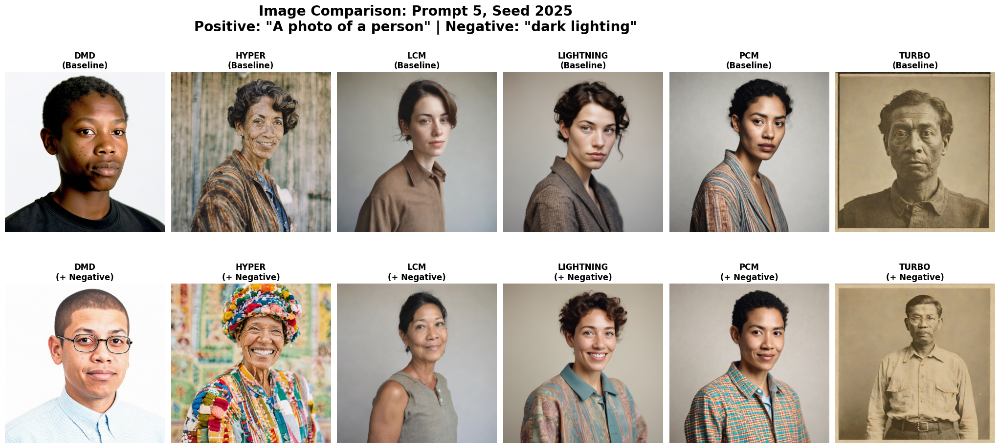


VISUAL ANALYSIS

Comparing across the 3 models (left to right: base, dmd, hyper):
  • TOP ROW: Original models WITHOUT negative guidance
  • BOTTOM ROW: Original models WITH negative guidance applied

Key observations:
  1. Visual differences between baseline (top) and with_neg (bottom)
  2. Consistency of negative suppression across models
  3. Image quality preservation (how much structure/content changes)

Model comparison:
  • base: [your observations]
  • dmd: [your observations]
  • hyper: [your observations]



In [ ]:

# Custom Image Panel: 3 Models × 2 Variants (Baseline vs With Negative)

print("=" * 120)
print("CUSTOM IMAGE PANEL: Baseline vs With Negative")
print("=" * 120)
print(f"Models: {', '.join(selected_models)}")

# Parameters
prompt_idx = 5
seed = '2025'
selected_models = [m for m in model_types if m != 'base']  # All models except base

# Get prompt info
if prompt_idx in prompts_dict:
    prompt_info = prompts_dict[prompt_idx]
    positive = prompt_info['prompt']
    negative = prompt_info['negative_prompt']
    print(f"Prompt {prompt_idx}:")
    print(f"  Positive: {positive}")
    print(f"  Negative: {negative}\n")

# Create figure: 2 rows (baseline, with_neg) × 3 columns (models)
# Create figure: 2 rows (baseline, with_neg) × N columns
n_cols = len(selected_models)
fig, axes = plt.subplots(2, n_cols, figsize=(4*n_cols, 10))
fig.suptitle(f'Image Comparison: Prompt {prompt_idx}, Seed {seed}\nPositive: "{positive}" | Negative: "{negative}"',
             fontsize=20, fontweight='bold', y=0.98)

# Row 0: Original Baseline (no negative)
# Row 1: Original with Negative

row_labels = ['', '']

for col, model_type in enumerate(selected_models):
    # Check if data exists for this model
    if model_type not in results_data or prompt_idx not in results_data[model_type]:
        print(f"Warning: No data for {model_type}, prompt {prompt_idx}")
        continue
    
    images_dict = results_data[model_type][prompt_idx]
    
    # ============ ROW 0: BASELINE ============
    ax = axes[0, col]
    if seed in images_dict['nag_baseline']:
        baseline_path = images_dict['nag_baseline'][seed]
        img = Image.open(baseline_path)
        ax.imshow(img)
        ax.set_title(f'{model_type.upper()}\n(Baseline)', fontweight='bold', fontsize=12)
    else:
        ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{model_type.upper()}\n(Baseline)', fontweight='bold', fontsize=12)
    
    ax.axis('off')
    
    # Add row label on left
    if col == 0:
        ax.text(-0.35, 0.5, row_labels[0], transform=ax.transAxes, fontsize=11, fontweight='bold',
               ha='right', va='center', rotation=0)
    
    # ============ ROW 1: WITH NEGATIVE ============
    ax = axes[1, col]
    if seed in images_dict['nag']:
        with_neg_path = images_dict['nag'][seed]
        img = Image.open(with_neg_path)
        ax.imshow(img)
        ax.set_title(f'{model_type.upper()}\n(+ Negative)', fontweight='bold', fontsize=12)
    else:
        ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{model_type.upper()}\n(+ Negative)', fontweight='bold', fontsize=12)
    
    ax.axis('off')
    
    # Add row label on left
    if col == 0:
        ax.text(-0.35, 0.5, row_labels[1], transform=ax.transAxes, fontsize=11, fontweight='bold',
               ha='right', va='center', rotation=0)

plt.tight_layout()
plt.subplots_adjust(left=0.15)
plt.show()

print("\n" + "=" * 120)
print("VISUAL ANALYSIS")
print("=" * 120)
print("""
Comparing across the 3 models (left to right: base, dmd, hyper):
  • TOP ROW: Original models WITHOUT negative guidance
  • BOTTOM ROW: Original models WITH negative guidance applied
  
Key observations:
  1. Visual differences between baseline (top) and with_neg (bottom)
  2. Consistency of negative suppression across models
  3. Image quality preservation (how much structure/content changes)
  
Model comparison:
  • base: [your observations]
  • dmd: [your observations]
  • hyper: [your observations]
""")

print("=" * 120)


CUSTOM IMAGE PANEL: Baseline vs With Negative
Models: dmd, hyper, lcm, lightning, pcm, turbo
Prompt 5:
  Positive: A photo of a person
  Negative: dark lighting



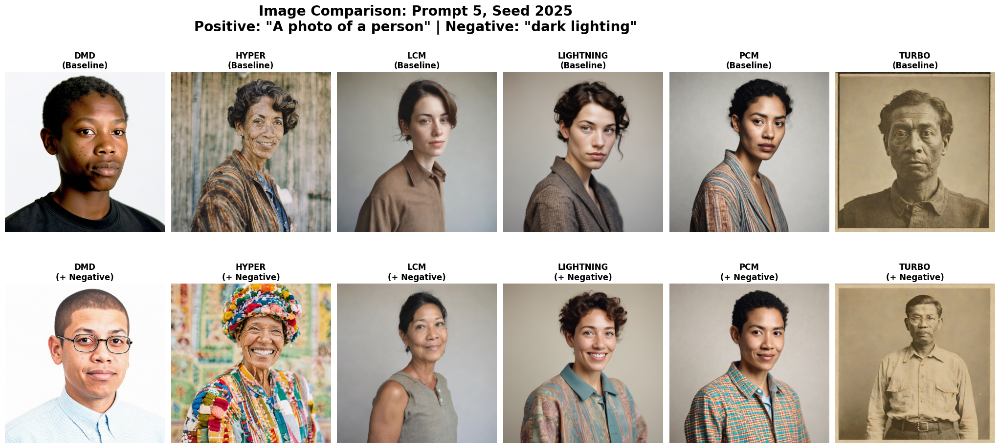


VISUAL ANALYSIS

Comparing across the 3 models (left to right: base, dmd, hyper):
  • TOP ROW: Original models WITHOUT negative guidance
  • BOTTOM ROW: Original models WITH negative guidance applied

Key observations:
  1. Visual differences between baseline (top) and with_neg (bottom)
  2. Consistency of negative suppression across models
  3. Image quality preservation (how much structure/content changes)

Model comparison:
  • base: [your observations]
  • dmd: [your observations]
  • hyper: [your observations]



In [ ]:

# Custom Image Panel: 3 Models × 2 Variants (Baseline vs With Negative)

print("=" * 120)
print("CUSTOM IMAGE PANEL: Baseline vs With Negative")
print("=" * 120)
print(f"Models: {', '.join(selected_models)}")

# Parameters
prompt_idx = 5
seed = '2025'
selected_models = [m for m in model_types if m != 'base']  # All models except base

# Get prompt info
if prompt_idx in prompts_dict:
    prompt_info = prompts_dict[prompt_idx]
    positive = prompt_info['prompt']
    negative = prompt_info['negative_prompt']
    print(f"Prompt {prompt_idx}:")
    print(f"  Positive: {positive}")
    print(f"  Negative: {negative}\n")

# Create figure: 2 rows (baseline, with_neg) × 3 columns (models)
# Create figure: 2 rows (baseline, with_neg) × N columns
n_cols = len(selected_models)
fig, axes = plt.subplots(2, n_cols, figsize=(4*n_cols, 10))
fig.suptitle(f'Image Comparison: Prompt {prompt_idx}, Seed {seed}\nPositive: "{positive}" | Negative: "{negative}"',
             fontsize=20, fontweight='bold', y=0.98)

# Row 0: Original Baseline (no negative)
# Row 1: Original with Negative

row_labels = ['', '']

for col, model_type in enumerate(selected_models):
    # Check if data exists for this model
    if model_type not in results_data or prompt_idx not in results_data[model_type]:
        print(f"Warning: No data for {model_type}, prompt {prompt_idx}")
        continue
    
    images_dict = results_data[model_type][prompt_idx]
    
    # ============ ROW 0: BASELINE ============
    ax = axes[0, col]
    if seed in images_dict['nag_baseline']:
        baseline_path = images_dict['nag_baseline'][seed]
        img = Image.open(baseline_path)
        ax.imshow(img)
        ax.set_title(f'{model_type.upper()}\n(Baseline)', fontweight='bold', fontsize=12)
    else:
        ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{model_type.upper()}\n(Baseline)', fontweight='bold', fontsize=12)
    
    ax.axis('off')
    
    # Add row label on left
    if col == 0:
        ax.text(-0.35, 0.5, row_labels[0], transform=ax.transAxes, fontsize=11, fontweight='bold',
               ha='right', va='center', rotation=0)
    
    # ============ ROW 1: WITH NEGATIVE ============
    ax = axes[1, col]
    if seed in images_dict['nag']:
        with_neg_path = images_dict['nag'][seed]
        img = Image.open(with_neg_path)
        ax.imshow(img)
        ax.set_title(f'{model_type.upper()}\n(+ Negative)', fontweight='bold', fontsize=12)
    else:
        ax.text(0.5, 0.5, 'No image', ha='center', va='center', transform=ax.transAxes, fontsize=12)
        ax.set_title(f'{model_type.upper()}\n(+ Negative)', fontweight='bold', fontsize=12)
    
    ax.axis('off')
    
    # Add row label on left
    if col == 0:
        ax.text(-0.35, 0.5, row_labels[1], transform=ax.transAxes, fontsize=11, fontweight='bold',
               ha='right', va='center', rotation=0)

plt.tight_layout()
plt.subplots_adjust(left=0.15)
plt.show()

print("\n" + "=" * 120)
print("VISUAL ANALYSIS")
print("=" * 120)
print("""
Comparing across the 3 models (left to right: base, dmd, hyper):
  • TOP ROW: Original models WITHOUT negative guidance
  • BOTTOM ROW: Original models WITH negative guidance applied
  
Key observations:
  1. Visual differences between baseline (top) and with_neg (bottom)
  2. Consistency of negative suppression across models
  3. Image quality preservation (how much structure/content changes)
  
Model comparison:
  • base: [your observations]
  • dmd: [your observations]
  • hyper: [your observations]
""")

print("=" * 120)
